In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import HuberRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RANSACRegressor
from sklearn.pipeline import make_pipeline

In [2]:
%cd ..

/home/marysia/Documents/GitHub/MRI_machine_learning


In [34]:
hf=False
if hf is False:
    df = pd.read_csv(f'data/preprocessed_atlas/positive_norm_confirmed_a2009/all_concatenated_prawidlowy.csv', sep=None, engine='python', dtype={'identifier': str})
else:
    df = pd.read_csv(f'data/preprocessed_atlas/positive_norm_confirmed_a2009/HF/all_concatenated_prawidlowy.csv', sep=None, engine='python', dtype={'identifier': str})

df = df.dropna()
df = df[df['IF_FIRST'] == 1]
df['age'] = pd.to_numeric(df['age'], errors='coerce')
df = df[(df['age'] >= 0) & (df['age'] <= 100)]

In [51]:
df

,A2009-ctx-lh-G_and_S_frontomargin_GrayVol,A2009-ctx-lh-G_and_S_frontomargin_ThickAvg,A2009-ctx-lh-G_and_S_frontomargin_ThickStd,A2009-ctx-lh-G_and_S_occipital_inf_GrayVol,A2009-ctx-lh-G_and_S_occipital_inf_ThickAvg,A2009-ctx-lh-G_and_S_occipital_inf_ThickStd,A2009-ctx-lh-G_and_S_paracentral_GrayVol,A2009-ctx-lh-G_and_S_paracentral_ThickAvg,A2009-ctx-lh-G_and_S_paracentral_ThickStd,A2009-ctx-lh-G_and_S_subcentral_GrayVol,...,DATA_BADANIA_MRI,norm_confirmed,female,male,DATA_BADANIA,IF_FIRST,L_BIAP,P_BIAP,L_HEARING_TYPE,P_HEARING_TYPE
0,2560.0,2.582,0.704,3351.0,2.597,0.714,2834.0,2.366,0.466,3927.0,...,2011-05-19,0,1,0,09.12.2013 11:31,1,Prawidlowy,Prawidlowy,Sluch_prawidlowy,Sluch_prawidlowy
1,2813.0,2.418,0.532,4324.0,2.513,0.643,2745.0,2.253,0.596,3496.0,...,2011-11-02,0,0,1,31.10.2011 12:21,1,Prawidlowy,Prawidlowy,Sluch_prawidlowy,Sluch_prawidlowy
2,2544.0,2.553,0.453,2999.0,2.215,0.525,2816.0,2.255,0.535,2991.0,...,2011-12-05,0,1,0,21.05.2012 08:48,1,Prawidlowy,Prawidlowy,Sluch_prawidlowy,Sluch_prawidlowy
3,2017.0,2.325,0.541,2966.0,2.510,0.589,2828.0,2.312,0.562,2573.0,...,2011-10-18,0,1,0,14.06.2011 11:33,1,Prawidlowy,Prawidlowy,Sluch_prawidlowy,Sluch_prawidlowy
6,2276.0,2.466,0.685,2555.0,2.402,0.578,2737.0,2.178,0.484,3127.0,...,2011-08-29,0,1,0,22.09.2010 09:52,1,Prawidlowy,Prawidlowy,Sluch_prawidlowy,Sluch_prawidlowy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10907,2592.0,2.388,0.588,4122.0,2.468,0.495,3297.0,2.328,0.564,3285.0,...,2024-02-21,0,1,0,17.01.2024 08:59,1,Prawidlowy,Prawidlowy,Sluch_prawidlowy,Sluch_prawidlowy
10908,2328.0,2.591,0.505,3022.0,2.259,0.565,2536.0,2.129,0.622,3462.0,...,2024-07-30,0,0,1,25.01.2018 10:10,1,Prawidlowy,Prawidlowy,Sluch_prawidlowy,Sluch_prawidlowy
10911,1777.0,2.431,0.574,2275.0,2.234,0.613,2748.0,2.333,0.643,2828.0,...,2024-08-26,0,1,0,17.10.2023 11:11,1,Prawidlowy,Prawidlowy,zaden typ nie pasuje,zaden typ nie pasuje
10912,2276.0,2.743,0.738,2637.0,2.456,0.640,2282.0,2.334,0.611,2686.0,...,2024-06-17,0,1,0,12.11.2018 14:04,1,Prawidlowy,Prawidlowy,Sluch_prawidlowy,Sluch_prawidlowy


In [4]:
def read_pathological_data(type='gleboki', hf=hf):
    if hf is False:
        df_path = pd.read_csv(f'data/preprocessed_atlas/positive_norm_confirmed_a2009/leave_out_{type}.csv', sep=None, engine='python', dtype={'identifier': str})
    else:
        df_path = pd.read_csv(f'data/preprocessed_atlas/positive_norm_confirmed_a2009/HF/leave_out_{type}.csv', sep=None, engine='python', dtype={'identifier': str})

    cols_to_check = df_path.columns.difference(['L_HEARING_TYPE', 'P_HEARING_TYPE'])
    df_path = df_path.dropna(subset=cols_to_check).copy()


    df_path = df_path[df_path['IF_FIRST'] == 1]
    df_path['DATA_BADANIA_MRI'] = pd.to_datetime(df_path['DATA_BADANIA_MRI'], format='%Y-%m-%d')
    df_path['DATA_BADANIA'] = pd.to_datetime(df_path['DATA_BADANIA'], dayfirst=True, errors='coerce')
    df_path = df_path[df_path['DATA_BADANIA_MRI'] > df_path['DATA_BADANIA']]

    df_path['age'] = pd.to_numeric(df_path['age'], errors='coerce')
    df_path = df_path[(df_path['age'] >= 0) & (df_path['age'] <= 100)]

    return df_path

In [35]:
df_gleboki = read_pathological_data('gleboki', hf)
df_znaczny = read_pathological_data('znaczny', hf)
df_umiarkowany = read_pathological_data('umiarkowany', hf)
df_lekki = read_pathological_data('lekki', hf)

In [67]:
df_lekki

,A2009-ctx-lh-G_and_S_frontomargin_GrayVol,A2009-ctx-lh-G_and_S_frontomargin_ThickAvg,A2009-ctx-lh-G_and_S_frontomargin_ThickStd,A2009-ctx-lh-G_and_S_occipital_inf_GrayVol,A2009-ctx-lh-G_and_S_occipital_inf_ThickAvg,A2009-ctx-lh-G_and_S_occipital_inf_ThickStd,A2009-ctx-lh-G_and_S_paracentral_GrayVol,A2009-ctx-lh-G_and_S_paracentral_ThickAvg,A2009-ctx-lh-G_and_S_paracentral_ThickStd,A2009-ctx-lh-G_and_S_subcentral_GrayVol,...,DATA_BADANIA_MRI,norm_confirmed,female,male,DATA_BADANIA,IF_FIRST,L_BIAP,P_BIAP,L_HEARING_TYPE,P_HEARING_TYPE
1,2213.0,2.336,0.558,3402.0,2.778,0.887,2325.0,2.201,0.665,2823.0,...,2011-07-11,0,1,0,2009-10-12 10:20:00,1,Lekki,Lekki,Niedosluch_odbiorczy_1,Niedosluch_odbiorczy_1
8,2522.0,2.611,0.455,3090.0,2.082,0.591,3269.0,2.239,0.694,3125.0,...,2011-07-04,0,0,1,2010-02-18 12:04:00,1,Lekki,Lekki,Niedosluch_odbiorczy_1,Niedosluch_odbiorczy_1
10,2396.0,2.542,0.732,2541.0,2.405,0.599,2789.0,2.403,0.720,2820.0,...,2011-12-30,0,1,0,2011-10-25 16:16:00,1,Lekki,Lekki,Niedosluch_przewodzeniowy,Niedosluch_odbiorczy_1
24,2270.0,2.303,0.551,2867.0,2.517,0.736,2969.0,2.200,0.735,3076.0,...,2011-11-29,0,1,0,2011-06-10 14:31:00,1,Lekki,Lekki,Niedosluch_mieszany,Niedosluch_mieszany
40,2257.0,2.179,0.559,1995.0,2.382,0.842,1965.0,1.846,0.564,2545.0,...,2011-04-26,0,1,0,2011-01-12 10:39:00,1,Lekki,Lekki,Niedosluch_odbiorczy_1,Niedosluch_odbiorczy_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12166,2775.0,2.488,0.687,3648.0,2.356,0.642,3301.0,2.236,0.676,3414.0,...,2024-09-10,0,0,1,2019-08-09 16:08:00,1,Lekki,Lekki,Niedosluch_odbiorczy_2,Niedosluch_odbiorczy_2
12168,2841.0,2.405,0.598,3721.0,2.359,0.778,2403.0,2.158,0.548,3043.0,...,2024-04-03,0,0,1,2024-03-08 13:20:00,1,Lekki,Lekki,Niedosluch_odbiorczy_1,Niedosluch_odbiorczy_1
12170,2042.0,2.117,0.475,2521.0,2.207,0.757,2195.0,2.079,0.591,2837.0,...,2024-04-15,0,0,1,2024-02-07 11:36:00,1,Lekki,Lekki,zaden typ nie pasuje,Niedosluch_odbiorczy_2
12171,1934.0,1.934,0.585,3566.0,2.493,0.862,2378.0,1.987,0.607,3045.0,...,2024-04-16,0,0,1,2018-02-15 08:58:00,1,Lekki,Lekki,Niedosluch_odbiorczy_1,Niedosluch_odbiorczy_1


In [82]:
df_gleboki['DATA_BADANIA'].sort_values()

1716   2009-08-27 09:32:00
820    2009-09-01 12:34:00
1694   2009-12-29 13:09:00
68     2009-12-31 10:24:00
386    2010-02-09 13:03:00
               ...        
1688   2021-05-21 09:47:00
1708   2022-04-28 08:10:00
1733   2022-10-19 12:58:00
1729   2023-01-03 08:26:00
1709   2023-10-16 08:58:00
Name: DATA_BADANIA, Length: 179, dtype: datetime64[ns]

In [45]:
print(f'Lekki: {len(df_lekki)}')
print(f'Umiarkowany: {len(df_umiarkowany)}')
print(f'Znaczny: {len(df_znaczny)}')
print(f'Gleboki: {len(df_gleboki)}')


Lekki: 2921
Umiarkowany: 1064
Znaczny: 156
Gleboki: 179


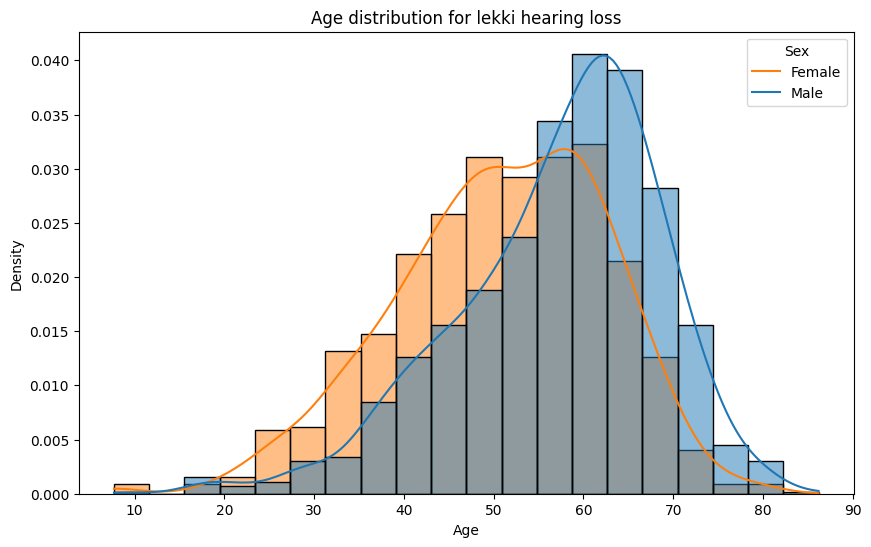

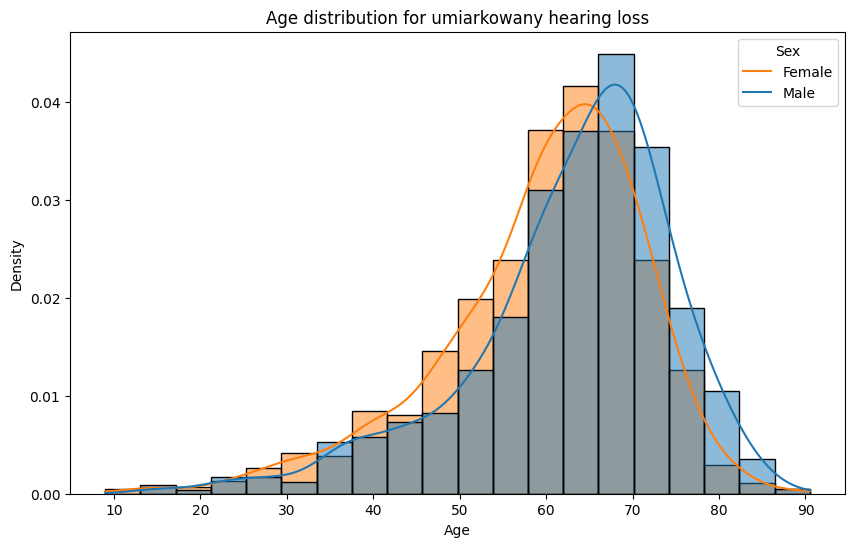

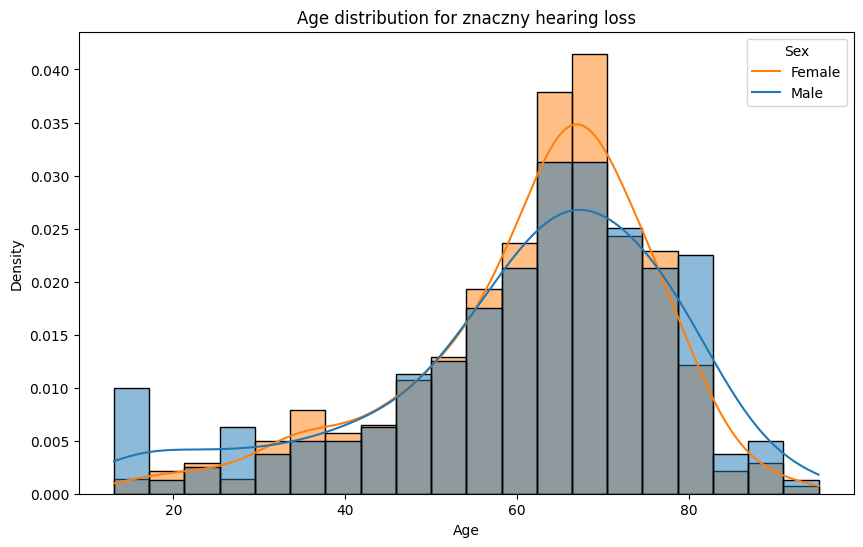

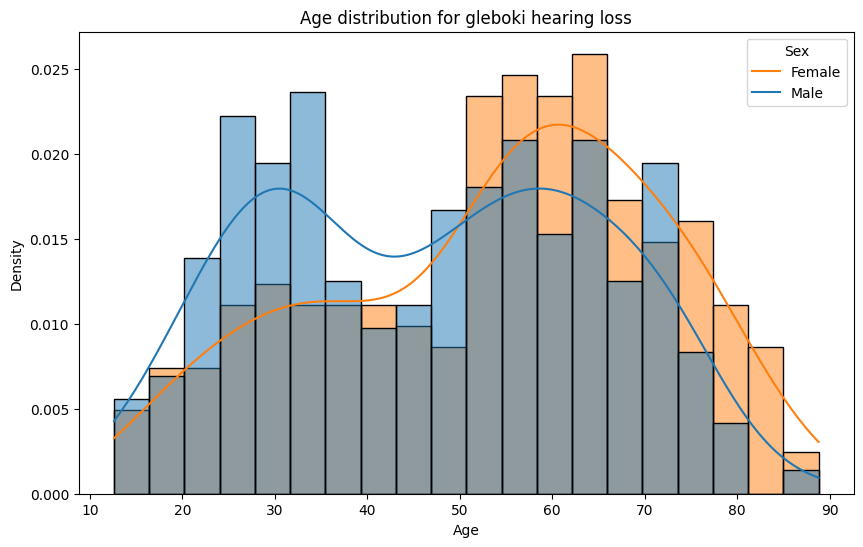

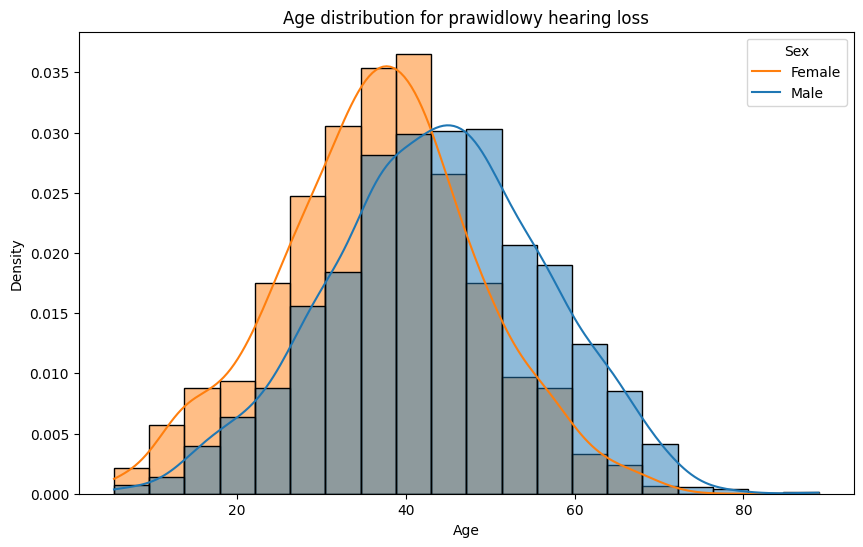

In [22]:
#plot age distribution of pathological data regarding sex and hearing loss type
import seaborn as sns
types = {
    'lekki': df_lekki,
    'umiarkowany': df_umiarkowany,
    'znaczny': df_znaczny,
    'gleboki': df_gleboki,
    'prawidlowy': df
}
for type in types:
    df_hearing = types[type]
    plt.figure(figsize=(10,6))
    sns.histplot(data=df_hearing, x='age', hue='male', bins=20, kde=True, stat='density', common_norm=False)
    plt.title(f'Age distribution for {type} hearing loss')
    plt.xlabel('Age')
    plt.ylabel('Density')
    plt.legend(title='Sex', labels=['Female', 'Male'])
    plt.show()      

In [9]:
#wielomian 2 stopnia
def plot_struct(ax, df, df_hearing, type, column, sex='M'):
    if sex =='M':
        df_sel = df[df['male']==1]
        df_hearing = df_hearing[df_hearing['male']==1]
    else:        
        df_sel = df[df['male']==0]
        df_hearing = df_hearing[df_hearing['male']==0]

    ax.scatter(df_sel['age'], df_sel[column], alpha=0.8, label='prawidłowy')
    ax.scatter(df_hearing['age'], df_hearing[column], alpha=0.8, label=type)

    #add hubert regression

    
    ransac_norm = make_pipeline(
        PolynomialFeatures(degree=2, include_bias=False),
        RANSACRegressor(
            estimator=LinearRegression(),
            min_samples=0.5,
            residual_threshold=None,
            random_state=42
        )
    )

    ransac_norm.fit(df_sel[['age']], df_sel[column])

    
    ransac_hearing = make_pipeline(
        PolynomialFeatures(degree=2, include_bias=False),
        RANSACRegressor(
            estimator=LinearRegression(),
            min_samples=0.5,
            residual_threshold=None,
            random_state=42
        )
    )

    ransac_hearing.fit(df_hearing[['age']], df_hearing[column])


    age_space = np.linspace(min(df_sel['age'].min(), df_hearing['age'].min()),
                            max(df_sel['age'].max(), df_hearing['age'].max()), 300).reshape(-1, 1)

    #ax.plot(age_space, poly_norm(age_space), label='fit prawidłowy', linewidth=2)
    #ax.plot(age_space, poly_deep(age_space), label=f'fit {type}', linewidth=2)
    ax.plot(
        age_space,
        ransac_norm.predict(age_space),
        label='RANSAC 2° prawidłowy',
        linewidth=2,
        linestyle='--',
        c='b'
    )

    ax.plot(
        age_space,
        ransac_hearing.predict(age_space),
        label=f'RANSAC 2° {type}',
        linewidth=2,
        linestyle='--',
        c='r'
    )

    ax.set_xlabel("Wiek")
    ax.set_ylabel(f"Wartość {column}")
    ax.legend()


In [51]:
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import r2_score
from scipy.stats import mannwhitneyu


#2 stopnia
def calculate_trends(df, df_hearing, sex='M'):
    if sex =='M':
        df_sel = df[df['male']==1]
        df_hearing = df_hearing[df_hearing['male']==1]
    else:        
        df_sel = df[df['male']==0]
        df_hearing = df_hearing[df_hearing['male']==0]
    age_space = np.linspace(df_sel['age'].min(), df_sel['age'].max(), 200).reshape(-1, 1)

    df_results = pd.DataFrame(columns=['feature_name', 'MAE_norm', 'mean'])
    
    #add huber regression    
    for column in df_sel.columns:
        if ('A2009' in column) or ('ASEG' in column):
            #scale features with robust scaler
            scaler = RobustScaler()
            y_norm_scaled = scaler.fit_transform(df_sel[[column]]).ravel()

            # Skalujemy słyszących tym samym scalerem
            y_hear_scaled = scaler.transform(df_hearing[[column]]).ravel()
            if len(np.unique(y_norm_scaled)) < 80:
                continue


            ransac_norm = make_pipeline(
            PolynomialFeatures(degree=2, include_bias=False),
            RANSACRegressor(
                    estimator=LinearRegression(),
                    min_samples=0.5,
                    residual_threshold=None,
                    random_state=42
                )
            )

            ransac_norm.fit(df_sel[['age']], y_norm_scaled)
            ransac_step = ransac_norm.named_steps['ransacregressor']
            lin_est = ransac_step.estimator_

            mae_norm = np.mean(np.abs(y_norm_scaled - ransac_norm.predict(df_sel[['age']])))
            mae_diff = np.mean(np.abs(y_hear_scaled - ransac_norm.predict(df_hearing[['age']]))) - mae_norm
            #mean_diff = np.mean(np.abs(y_hear_scaled - y_norm))
            mae_diff_stand = mae_diff / (np.std(y_norm_scaled) * np.std(y_hear_scaled))
            #r2_norm = r2_score(y_norm_scaled, ransac_norm.predict(df_sel[['age']]))
            #mae_norm = mae_norm / r2_norm

            y_pred = ransac_norm.predict(df_sel[['age']])
            diff_sample = y_norm_scaled - y_pred

            #mannwhitneyu
            y_pred_norm = ransac_norm.predict(df_sel[['age']])
            r_norm = y_norm_scaled - y_pred_norm
            y_pred_hear = ransac_norm.predict(df_hearing[['age']])
            r_hear = y_hear_scaled - y_pred_hear

            stat, p_value = mannwhitneyu(
                r_norm,
                r_hear,
                alternative='two-sided'
            )

            n1 = len(r_norm)
            n2 = len(r_hear)

            U = stat
            rbc = 1 - (2*U)/(n1*n2)

            df_results = pd.concat([
                df_results,
                pd.DataFrame([{
                    'feature_name': column,
                    'Norm_Coeff_age': lin_est.coef_[0],
                    'Norm_Coeff_age2': lin_est.coef_[1],
                    'Norm_Intercept': lin_est.intercept_,
                    'MAE_norm': mae_norm,
                    'mean': mae_diff_stand,
                    'Scaler_center': scaler.center_[0],
                    'Scaler_scale': scaler.scale_[0],
                    'MW_p': p_value,
                    'MW_rbc': rbc
                }])
            ], ignore_index=True)


    return df_results

In [156]:
from sklearn.linear_model import QuantileRegressor

def calculate_trends_quantile(df, sex='M', quantiles=[0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99]):
    if sex == 'M':
        df_sel = df[df['male'] == 1]
    else:
        df_sel = df[df['male'] == 0]

    
    df_results = pd.DataFrame()
    
    for column in df_sel.columns:
        if ('A2009' in column) or ('ASEG' in column):
            # filtr na małą unikalność
            if len(np.unique(df_sel[column])) < 80:
                continue
            
            # RobustScaler
            scaler = RobustScaler()
            y_norm_scaled = scaler.fit_transform(df_sel[[column]]).ravel()
            
            # przygotowanie wieku
            X = df_sel[['age']].values

            # słownik do wyników
            feature_dict = {
                'feature_name': column,
                'Scaler_center': scaler.center_[0],
                'Scaler_scale': scaler.scale_[0],
            }

            # dopasowanie kwantyli
            for q in quantiles:
                qr_pipeline = make_pipeline(
                    PolynomialFeatures(degree=2, include_bias=False),
                    QuantileRegressor(quantile=q, alpha=0)  # alpha=0 brak regularizacji
                )
                qr_pipeline.fit(X, y_norm_scaled)
                coef = qr_pipeline.named_steps['quantileregressor'].coef_
                intercept = qr_pipeline.named_steps['quantileregressor'].intercept_

                feature_dict[f'Q{int(q*100)}_Coef_age'] = coef[0]
                feature_dict[f'Q{int(q*100)}_Coef_age2'] = coef[1]
                feature_dict[f'Q{int(q*100)}_Intercept'] = intercept

            # MAE i różnice mediany (q=0.5)
            median_pred = (feature_dict['Q50_Coef_age2'] * df_sel['age']**2 +
                           feature_dict['Q50_Coef_age'] * df_sel['age'] +
                           feature_dict['Q50_Intercept'])
            mae_norm = np.mean(np.abs(y_norm_scaled - median_pred))
            feature_dict['MAE_norm'] = mae_norm

            # dopisanie do df_results
            df_results = pd.concat([df_results, pd.DataFrame([feature_dict])], ignore_index=True)
    
    return df_results

In [64]:
from sklearn.preprocessing import RobustScaler
import statsmodels.api as sm
from statsmodels.stats.multitest import multipletests
import numpy as np
import pandas as pd

def age_corrected_group_test(df, df_hearing, sex='M'):

    if sex == 'M':
        df_sel = df[df['male'] == 1]
        df_hear = df_hearing[df_hearing['male'] == 1]
    else:
        df_sel = df[df['male'] == 0]
        df_hear = df_hearing[df_hearing['male'] == 0]

    results = []

    for column in df_sel.columns:
        if ('A2009' in column) or ('ASEG' in column):

            # Healthy
            df_norm_tmp = df_sel[['age', column]].copy()
            df_norm_tmp['group'] = 0

            # Hearing
            df_hear_tmp = df_hear[['age', column]].copy()
            df_hear_tmp['group'] = 1

            # Combine
            df_all = pd.concat([df_norm_tmp, df_hear_tmp])
            df_all = df_all.dropna()

            if len(df_all) < 50:
                continue

            # Scale feature
            scaler = RobustScaler()
            df_all['feature_scaled'] = scaler.fit_transform(df_all[[column]])

            # Nonlinear age correction
            df_all['age2'] = df_all['age']**2

            # Design matrix
            X = df_all[['group', 'age', 'age2']]
            X = sm.add_constant(X)

            y = df_all['feature_scaled']

            try:
                model = sm.OLS(y, X).fit()
            except:
                continue

            beta = model.params['group']
            p_value = model.pvalues['group']

            # standardized effect size
            effect_size = beta / np.std(y)

            results.append({
                'feature_name': column,
                'Beta_group': beta,
                'Effect_size': effect_size,
                'p_value': p_value,
                'N_total': len(df_all)
            })

    df_results = pd.DataFrame(results)

    # FDR correction
    if len(df_results) > 0:
        df_results['p_fdr'] = multipletests(
            df_results['p_value'],
            method='fdr_bh'
        )[1]

    return df_results

In [ ]:
def plot_quantile_trend(df_sel, feature_name, df_one=None, quantiles=[0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99]):
    # Skalowanie
    scaler = RobustScaler()
    y_scaled = scaler.fit_transform(df_sel[[feature_name]]).ravel()
    age = df_sel['age'].values.reshape(-1,1)

    # Predykcje kwantylowe
    age_space = np.linspace(age.min(), age.max(), 200).reshape(-1,1)
    quantile_lines = {}
    for q in quantiles:
        qr_pipeline = make_pipeline(
            PolynomialFeatures(degree=2, include_bias=False),
            QuantileRegressor(quantile=q, alpha=0)
        )
        qr_pipeline.fit(age, y_scaled)
        coef = qr_pipeline.named_steps['quantileregressor'].coef_
        intercept = qr_pipeline.named_steps['quantileregressor'].intercept_
        quantile_lines[q] = coef[1]*age_space**2 + coef[0]*age_space + intercept

    # Wykres
    plt.figure(figsize=(10,6))
    plt.scatter(age, y_scaled, color='blue', alpha=0.5, label='Dane skalowane')

    # trend mediany
    plt.plot(age_space, quantile_lines[0.5], color='red', linewidth=2, label='q=0.5')

    # percentyle
    colors = plt.cm.viridis(np.linspace(0,1,len(quantiles)))
    for i, q in enumerate(quantiles):
        if q == 0.5:
            continue  # medianę już mamy
        plt.plot(age_space, quantile_lines[q], color=colors[i], linestyle='--', label=f'q={q}')
    if df_one is not None:
        y_one_scaled=scaler.transform(df_one[[feature_name]]).ravel()
        age_one=df_one['age']
        plt.scatter(age_one.values, y_one_scaled, color='red', s=100, marker='X', label='Próbka osoby')

    plt.xlabel('Age')
    plt.ylabel(feature_name)
    plt.title(f'Quantile regression dla {feature_name}')
    plt.legend()
    plt.show()


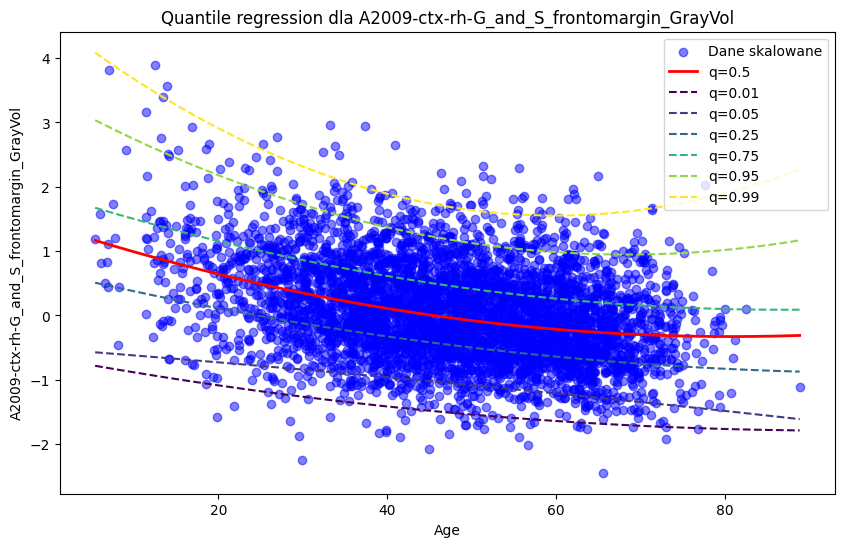

In [132]:
plot_quantile_trend(df, 'A2009-ctx-rh-G_and_S_frontomargin_GrayVol')

In [ ]:
types =['lekki', 'umiarkowany', 'znaczny', 'gleboki']
dfs_hearing = {
    'lekki': df_lekki,
    'umiarkowany': df_umiarkowany,
    'znaczny': df_znaczny,
    'gleboki': df_gleboki
}


sex = 'M'
for type in types:
    df_hearing = dfs_hearing[type]
    df_results = calculate_trends(df, df_hearing, sex=sex)
    #sort df_results by mean descending
    df_results_sorted = df_results.sort_values(by='mean', ascending=False)
    df_results_sorted.to_csv(f'results/brain_structures_hearing/hearing_{type}_trends_{sex}_robust_scaled_degree_2_hf_{hf}.csv', index=False)

In [65]:
types =['lekki', 'umiarkowany', 'znaczny', 'gleboki']
dfs_hearing = {
    'lekki': df_lekki,
    'umiarkowany': df_umiarkowany,
    'znaczny': df_znaczny,
    'gleboki': df_gleboki
}
types = ['gleboki']
dfs_hearing = {
    'gleboki': df_gleboki
}

sex = 'M'
for type in types:
    df_hearing = dfs_hearing[type]
    df_results = age_corrected_group_test(df, df_hearing, sex=sex)
    #sort df_results by p-value ascending
    df_results_sorted = df_results.sort_values(by='p_fdr', ascending=True)
    df_results_sorted.to_csv(f'results/brain_structures_hearing/stat_test_{type}_trends_{sex}_hf_{hf}.csv', index=False)

/tmp/ipykernel_167177/1326032020.py:58: RuntimeWarning: invalid value encountered in scalar divide
  effect_size = beta / np.std(y)
/tmp/ipykernel_167177/1326032020.py:58: RuntimeWarning: invalid value encountered in scalar divide
  effect_size = beta / np.std(y)
/tmp/ipykernel_167177/1326032020.py:58: RuntimeWarning: invalid value encountered in scalar divide
  effect_size = beta / np.std(y)
/tmp/ipykernel_167177/1326032020.py:58: RuntimeWarning: invalid value encountered in scalar divide
  effect_size = beta / np.std(y)
/tmp/ipykernel_167177/1326032020.py:58: RuntimeWarning: invalid value encountered in scalar divide
  effect_size = beta / np.std(y)
/tmp/ipykernel_167177/1326032020.py:58: RuntimeWarning: invalid value encountered in scalar divide
  effect_size = beta / np.std(y)
/tmp/ipykernel_167177/1326032020.py:58: RuntimeWarning: invalid value encountered in scalar divide
  effect_size = beta / np.std(y)
/tmp/ipykernel_167177/1326032020.py:58: RuntimeWarning: invalid value encoun

In [59]:
df_difference = df_results[df_results['MW_p'] < 0.05]

In [61]:
df_difference.to_csv(f'results/brain_structures_hearing/stat_test_hearing_{type}.csv')

In [ ]:
import os
tw_path = 'data/TW/TW_a2009_aseg'
df_all = pd.DataFrame()
for file in os.listdir(tw_path):
    path = os.path.join(tw_path, file)
    df_con = pd.read_csv(path, sep=None, engine='python', dtype={'identifier': str} )
    df_all = pd.concat((df_all, df_con), axis=1)
print(df_all)

     male  female   age  norm_confirmed identifier  \
0       1       0  36.1               1        TW1   
1       1       0  36.1               1        TW2   
2       1       0  36.4               1        TW3   
3       1       0  36.5               1        TW4   
4       1       0  37.0               1        TW5   
..    ...     ...   ...             ...        ...   
153     1       0  51.4               1      TW154   
154     1       0  51.5               1      TW155   
155     1       0  51.5               1      TW156   
156     1       0  51.5               1      TW157   
157     1       0  51.5               1      TW158   

     A2009-ctx-rh-G_and_S_frontomargin_GrayVol  \
0                                         1857   
1                                         2091   
2                                         2226   
3                                         1981   
4                                         2017   
..                                         ...   
1

In [41]:
df_all = df_all.loc[:, ~df_all.columns.str.contains("Unnamed")]
aseg_columns = [
    "ASEG-Left-WM-hypointensities_Volume_mm3",
    "ASEG-Left-WM-hypointensities_normMean",
    "ASEG-Left-WM-hypointensities_normStdDev",
    "ASEG-Left-WM-hypointensities_normMin",
    "ASEG-Left-WM-hypointensities_normMax",
    "ASEG-Left-WM-hypointensities_normRange",
    "ASEG-Right-WM-hypointensities_Volume_mm3",
    "ASEG-Right-WM-hypointensities_normMean",
    "ASEG-Right-WM-hypointensities_normStdDev",
    "ASEG-Right-WM-hypointensities_normMin",
    "ASEG-Right-WM-hypointensities_normMax",
    "ASEG-Right-WM-hypointensities_normRange",
    "ASEG-non-WM-hypointensities_Volume_mm3",
    "ASEG-non-WM-hypointensities_normMean",
    "ASEG-non-WM-hypointensities_normStdDev",
    "ASEG-non-WM-hypointensities_normMin",
    "ASEG-non-WM-hypointensities_normMax",
    "ASEG-non-WM-hypointensities_normRange",
    "ASEG-Left-non-WM-hypointensities_Volume_mm3",
    "ASEG-Left-non-WM-hypointensities_normMean",
    "ASEG-Left-non-WM-hypointensities_normStdDev",
    "ASEG-Left-non-WM-hypointensities_normMin",
    "ASEG-Left-non-WM-hypointensities_normMax",
    "ASEG-Left-non-WM-hypointensities_normRange",
    "ASEG-Right-non-WM-hypointensities_Volume_mm3",
    "ASEG-Right-non-WM-hypointensities_normMean",
    "ASEG-Right-non-WM-hypointensities_normStdDev",
    "ASEG-Right-non-WM-hypointensities_normMin",
    "ASEG-Right-non-WM-hypointensities_normMax",
    "ASEG-Right-non-WM-hypointensities_normRange",
    "ASEG-5th-Ventricle_Volume_mm3",
    "ASEG-5th-Ventricle_normMean",
    "ASEG-5th-Ventricle_normStdDev",
    "ASEG-5th-Ventricle_normMin",
    "ASEG-5th-Ventricle_normMax",
    "ASEG-5th-Ventricle_normRange",
]
df_all = df_all.drop(columns=aseg_columns, errors="ignore")

In [42]:
df_all.to_csv('data/TW/all_concatenated.csv')

In [46]:
tw_sample = pd.read_csv('data/TW/TW_sample.csv',  sep=None, engine='python', dtype={'identifier': str})

In [47]:
tw_sample

,male,female,age,norm_confirmed,identifier,A2009-ctx-rh-G_and_S_frontomargin_GrayVol,A2009-ctx-rh-G_and_S_frontomargin_ThickAvg,A2009-ctx-rh-G_and_S_frontomargin_ThickStd,A2009-ctx-rh-G_and_S_occipital_inf_GrayVol,A2009-ctx-rh-G_and_S_occipital_inf_ThickAvg,...,ASEG-CC_Mid_Anterior_normStdDev,ASEG-CC_Mid_Anterior_normMin,ASEG-CC_Mid_Anterior_normMax,ASEG-CC_Mid_Anterior_normRange,ASEG-CC_Anterior_Volume_mm3,ASEG-CC_Anterior_normMean,ASEG-CC_Anterior_normStdDev,ASEG-CC_Anterior_normMin,ASEG-CC_Anterior_normMax,ASEG-CC_Anterior_normRange
0,1,0,36.1,1,TW1,1857,2.412,0.537,2617,2.747,...,14.2058,50,118,68,789.2,99.9434,8.9362,53,119,66


In [157]:
sex='M'
df_results = calculate_trends_quantile(df, sex=sex)

In [158]:
df_results

,feature_name,Scaler_center,Scaler_scale,Q1_Coef_age,Q1_Coef_age2,Q1_Intercept,Q5_Coef_age,Q5_Coef_age2,Q5_Intercept,Q25_Coef_age,...,Q75_Coef_age,Q75_Coef_age2,Q75_Intercept,Q95_Coef_age,Q95_Coef_age2,Q95_Intercept,Q99_Coef_age,Q99_Coef_age2,Q99_Intercept,MAE_norm
0,A2009-ctx-lh-G_and_S_frontomargin_GrayVol,2428.0000,449.0000,0.036834,-0.000555,-1.991750,0.005518,-0.000252,-0.732511,-0.025843,...,-0.020040,-0.000022,1.420241,-0.039831,0.000117,2.712079,-0.047629,0.000230,3.248351,0.547671
1,A2009-ctx-lh-G_and_S_frontomargin_ThickAvg,2.3830,0.2470,0.008653,-0.000155,-1.625903,0.008774,-0.000154,-1.193677,-0.020164,...,-0.050560,0.000404,1.892073,-0.063039,0.000469,3.068521,-0.053859,0.000339,3.578159,0.587033
2,A2009-ctx-lh-G_and_S_frontomargin_ThickStd,0.5670,0.1030,-0.027588,0.000162,-0.572501,-0.044435,0.000325,0.264311,-0.064809,...,-0.086212,0.000764,2.714150,-0.121959,0.001180,4.278667,-0.106632,0.000971,4.891820,0.586657
3,A2009-ctx-lh-G_and_S_occipital_inf_GrayVol,3286.0000,850.0000,0.000911,-0.000046,-1.222900,-0.008237,0.000005,-0.616572,-0.005385,...,-0.021875,0.000066,1.391434,-0.012585,-0.000054,1.982809,-0.020562,-0.000003,2.855809,0.570899
4,A2009-ctx-lh-G_and_S_occipital_inf_ThickAvg,2.4050,0.2430,0.035579,-0.000518,-2.112616,-0.017873,0.000071,-0.514396,-0.034867,...,-0.056610,0.000494,1.953740,-0.084287,0.000774,3.362625,-0.069477,0.000599,3.520761,0.586225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
783,ASEG-wm-rh-transversetemporal_normStdDev,5.3177,1.5866,-0.015079,0.000102,-0.502870,-0.006192,-0.000019,-0.436568,-0.004228,...,0.004515,-0.000193,0.827801,-0.019937,0.000064,1.874657,-0.066956,0.000481,3.455983,0.518173
784,ASEG-wm-rh-insula_Volume_mm3,10416.2000,1376.3000,0.040718,-0.000420,-2.529760,0.030488,-0.000301,-1.876639,0.035942,...,0.035660,-0.000342,-0.348698,0.036623,-0.000404,0.465077,0.062355,-0.000690,0.568382,0.589449
785,ASEG-wm-rh-insula_normMean,98.5979,1.6459,0.145123,-0.001498,-5.355068,0.115259,-0.001169,-4.084118,0.074706,...,0.048238,-0.000519,-0.577426,0.047506,-0.000539,0.096874,0.036203,-0.000460,0.800781,0.592685
786,ASEG-wm-rh-insula_normStdDev,7.0825,1.8666,-0.020538,0.000169,-0.300349,-0.023839,0.000222,-0.135408,-0.018967,...,-0.018111,0.000133,1.140944,-0.033197,0.000256,2.022396,-0.091620,0.000948,3.526022,0.520895


In [162]:
def calculate_ones_differences(sample, norm_results=df_results, quantiles=[1, 5, 25, 50, 75, 95, 99]):
    

    for column in sample:
        if ('A2009' in column) or ('ASEG' in column):
            if column in norm_results['feature_name'].values:
                idx = norm_results.index[norm_results["feature_name"] == column]
                age = sample['age']

                #parametry dopasowania
                row = df_results.loc[df_results["feature_name"] == column].iloc[0]
                #a = row["Norm_Coeff_age2"]
                #b = row["Norm_Coeff_age"]
                #c = row["Norm_Intercept"]
         
                preds = {}

                for q in quantiles:
                    a = row[f'Q{q}_Coef_age2']
                    b = row[f'Q{q}_Coef_age']
                    c = row[f'Q{q}_Intercept']
                    preds[q] = a * age**2 + b * age + c

                scaler = RobustScaler()
                scaler.center_ = np.array([row["Scaler_center"]])
                scaler.scale_ = np.array([row["Scaler_scale"]])
                y_sample_scaled = scaler.transform(sample[[column]]).ravel()

                #norm_fun_value = a * age**2 + b*age + c
                #diff_sample = (norm_fun_value - y_sample_scaled).mean() #/ row['MAE_norm']

                for i, q in enumerate(quantiles):
                    if y_sample_scaled <= preds[q][0]:
                        sample_quantile = q
                        break
                else:
                    sample_quantile = 100
                df_results.loc[idx, 'quantile'] = sample_quantile


    return df_results

In [163]:
df_results = calculate_ones_differences(tw_sample, df_results)

/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but RobustScaler was fitted without feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but RobustScaler was fitted without feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but RobustScaler was fitted without feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but RobustScaler was fitted without feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but RobustScaler was fitted without feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.

In [164]:
df_results

,feature_name,Scaler_center,Scaler_scale,Q1_Coef_age,Q1_Coef_age2,Q1_Intercept,Q5_Coef_age,Q5_Coef_age2,Q5_Intercept,Q25_Coef_age,...,Q75_Coef_age2,Q75_Intercept,Q95_Coef_age,Q95_Coef_age2,Q95_Intercept,Q99_Coef_age,Q99_Coef_age2,Q99_Intercept,MAE_norm,quantile
0,A2009-ctx-lh-G_and_S_frontomargin_GrayVol,2428.0000,449.0000,0.036834,-0.000555,-1.991750,0.005518,-0.000252,-0.732511,-0.025843,...,-0.000022,1.420241,-0.039831,0.000117,2.712079,-0.047629,0.000230,3.248351,0.547671,75.0
1,A2009-ctx-lh-G_and_S_frontomargin_ThickAvg,2.3830,0.2470,0.008653,-0.000155,-1.625903,0.008774,-0.000154,-1.193677,-0.020164,...,0.000404,1.892073,-0.063039,0.000469,3.068521,-0.053859,0.000339,3.578159,0.587033,25.0
2,A2009-ctx-lh-G_and_S_frontomargin_ThickStd,0.5670,0.1030,-0.027588,0.000162,-0.572501,-0.044435,0.000325,0.264311,-0.064809,...,0.000764,2.714150,-0.121959,0.001180,4.278667,-0.106632,0.000971,4.891820,0.586657,75.0
3,A2009-ctx-lh-G_and_S_occipital_inf_GrayVol,3286.0000,850.0000,0.000911,-0.000046,-1.222900,-0.008237,0.000005,-0.616572,-0.005385,...,0.000066,1.391434,-0.012585,-0.000054,1.982809,-0.020562,-0.000003,2.855809,0.570899,50.0
4,A2009-ctx-lh-G_and_S_occipital_inf_ThickAvg,2.4050,0.2430,0.035579,-0.000518,-2.112616,-0.017873,0.000071,-0.514396,-0.034867,...,0.000494,1.953740,-0.084287,0.000774,3.362625,-0.069477,0.000599,3.520761,0.586225,99.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
783,ASEG-wm-rh-transversetemporal_normStdDev,5.3177,1.5866,-0.015079,0.000102,-0.502870,-0.006192,-0.000019,-0.436568,-0.004228,...,-0.000193,0.827801,-0.019937,0.000064,1.874657,-0.066956,0.000481,3.455983,0.518173,NaN
784,ASEG-wm-rh-insula_Volume_mm3,10416.2000,1376.3000,0.040718,-0.000420,-2.529760,0.030488,-0.000301,-1.876639,0.035942,...,-0.000342,-0.348698,0.036623,-0.000404,0.465077,0.062355,-0.000690,0.568382,0.589449,NaN
785,ASEG-wm-rh-insula_normMean,98.5979,1.6459,0.145123,-0.001498,-5.355068,0.115259,-0.001169,-4.084118,0.074706,...,-0.000519,-0.577426,0.047506,-0.000539,0.096874,0.036203,-0.000460,0.800781,0.592685,NaN
786,ASEG-wm-rh-insula_normStdDev,7.0825,1.8666,-0.020538,0.000169,-0.300349,-0.023839,0.000222,-0.135408,-0.018967,...,0.000133,1.140944,-0.033197,0.000256,2.022396,-0.091620,0.000948,3.526022,0.520895,NaN


0    36.1
Name: age, dtype: float64 [0.70434783]


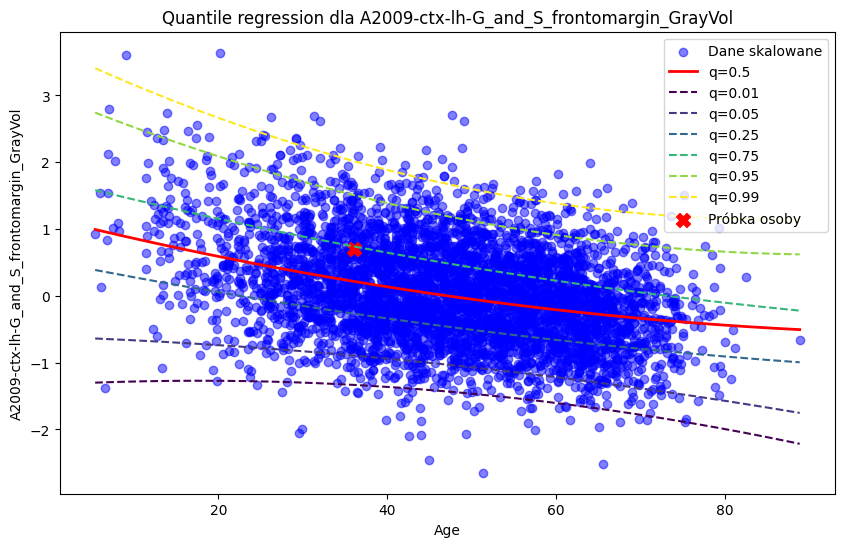

0    36.1
Name: age, dtype: float64 [0.69863014]


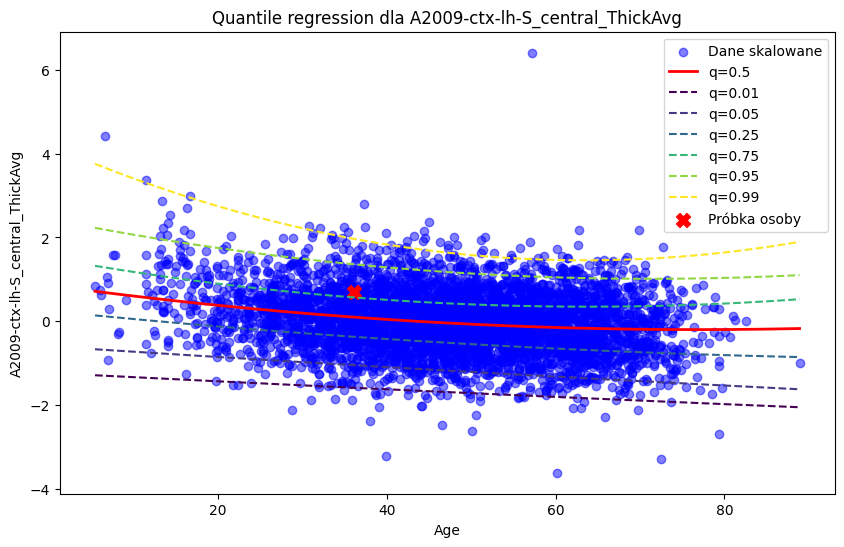

In [155]:
plot_quantile_trend(df, 'A2009-ctx-lh-G_and_S_frontomargin_GrayVol', tw_sample)
plot_quantile_trend(df, 'A2009-ctx-lh-S_central_ThickAvg', tw_sample)


In [165]:
df_results.to_csv(f'results/brain_structures_hearing/hearing_{type}_trends_{sex}_robust_scaled_degree_2_hf_{hf}_sample_TW_quantiles.csv', index=False)

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

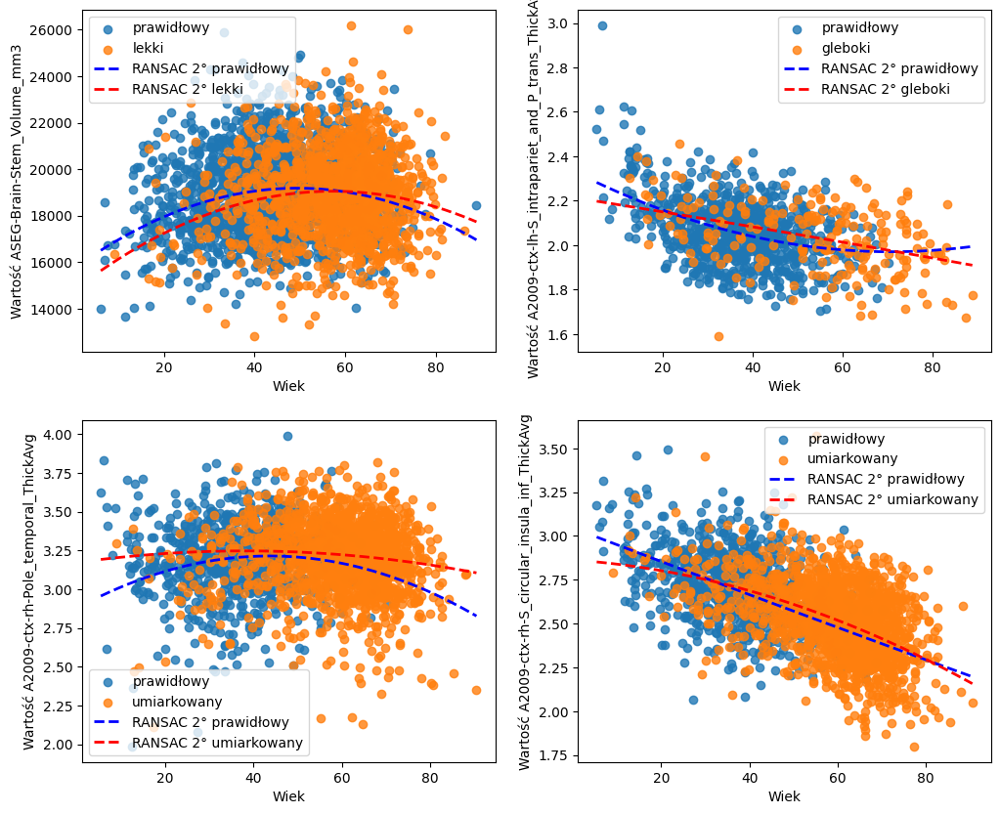

In [ ]:
#hf
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'ASEG-Brain-Stem_Volume_mm3', sex='F')
plot_struct(axes[0,1], df, df_gleboki, 'gleboki',
            'A2009-ctx-lh-S_intrapariet_and_P_trans_ThickAvg', sex='M')
plot_struct(axes[1,0], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-rh-Pole_temporal_ThickAvg', sex='M')
plot_struct(axes[1,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-rh-S_circular_insula_inf_ThickAvg', sex='M')

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

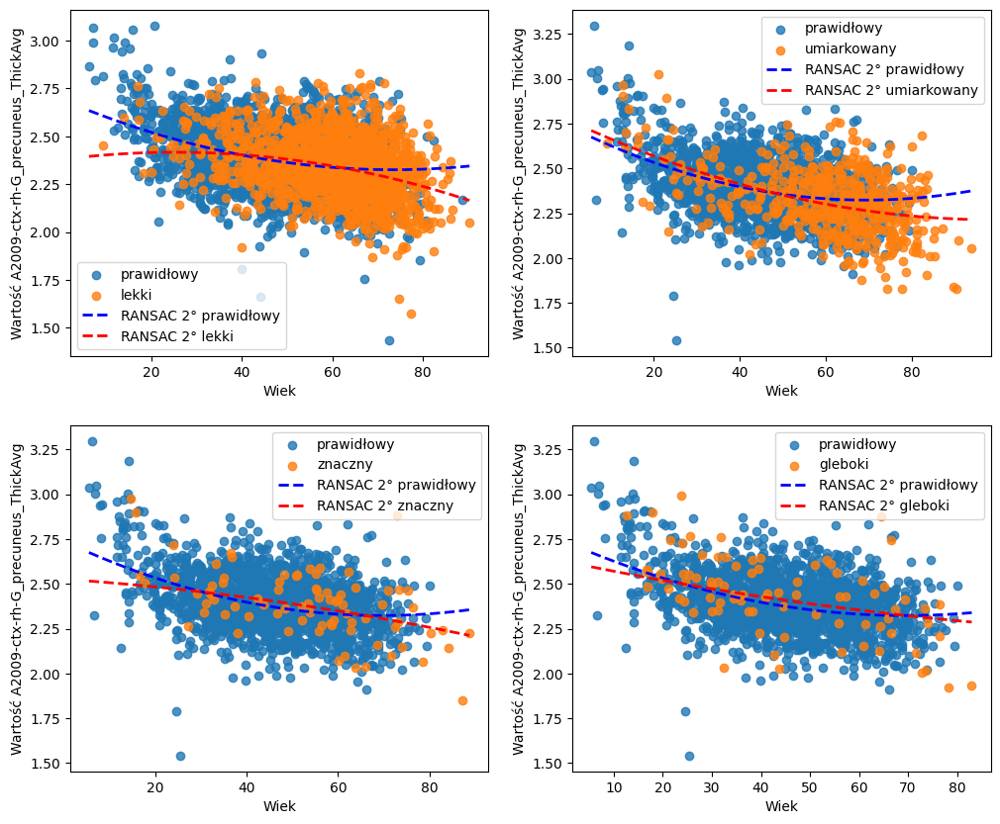

In [47]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-rh-G_precuneus_ThickAvg', sex='F')
plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-rh-G_precuneus_ThickAvg', sex='M')
plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-rh-G_precuneus_ThickAvg', sex='M')
plot_struct(axes[1,1], df, df_gleboki, 'gleboki',
            'A2009-ctx-rh-G_precuneus_ThickAvg', sex='M')

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

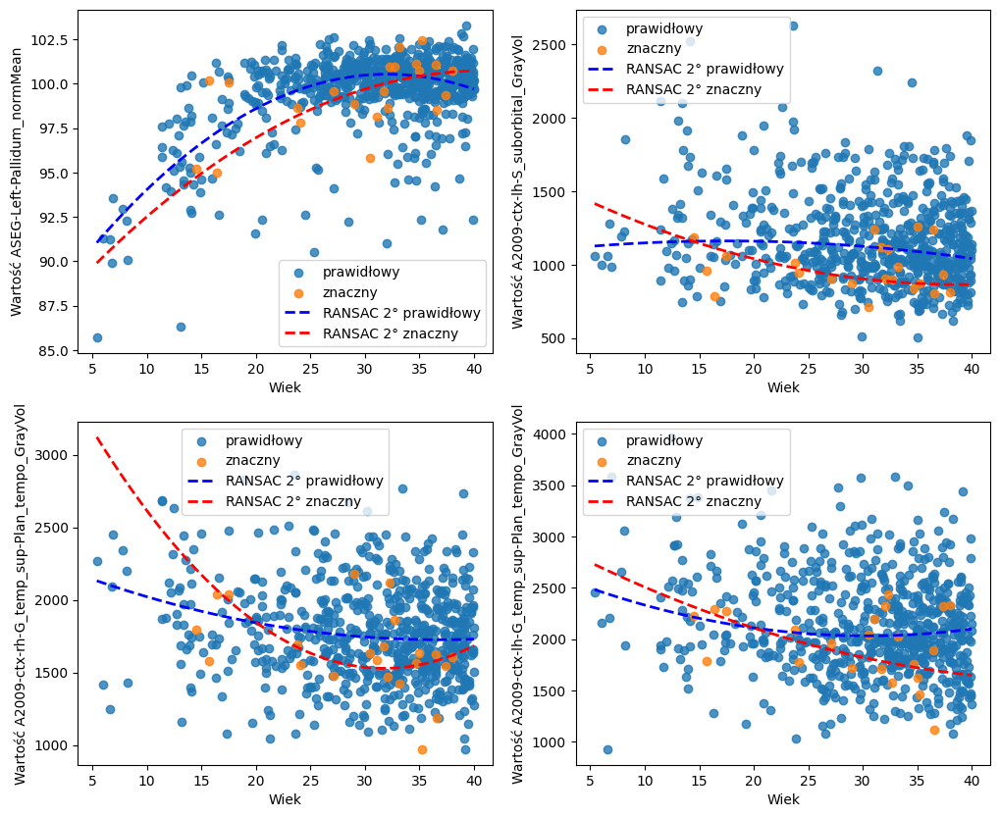

In [ ]:
df_znaczny_filtered = df_znaczny[(df_znaczny['age'] >= 0) & (df_znaczny['age'] <= 40)]
df_filtered = df[(df['age'] >= 0) & (df['age'] <= 40)]

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df_filtered, df_znaczny_filtered, 'znaczny',
            'ASEG-Left-Pallidum_normMean', sex='M')
plot_struct(axes[0,1], df_filtered, df_znaczny_filtered, 'znaczny',
            'A2009-ctx-lh-S_suborbital_GrayVol', sex='M')
plot_struct(axes[1,0], df_filtered, df_znaczny_filtered, 'znaczny',
            'A2009-ctx-rh-G_temp_sup-Plan_tempo_GrayVol', sex='M')
plot_struct(axes[1,1], df_filtered, df_znaczny_filtered, 'znaczny',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')


/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

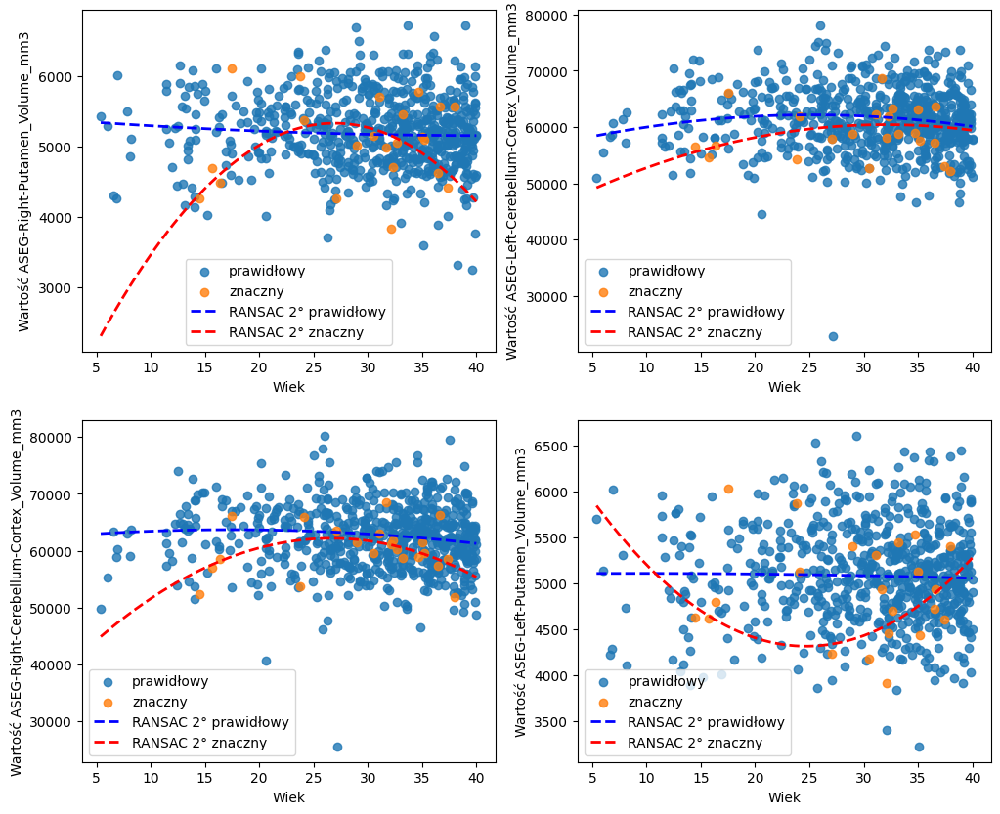

In [54]:
df_umiarkowany_filtered = df_znaczny[(df_znaczny['age'] >= 0) & (df_znaczny['age'] <= 40)]
df_filtered = df[(df['age'] >= 0) & (df['age'] <= 40)]

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df_filtered, df_umiarkowany_filtered, 'znaczny',
            'ASEG-Right-Putamen_Volume_mm3', sex='M')
plot_struct(axes[0,1], df_filtered, df_umiarkowany_filtered, 'znaczny',
            'ASEG-Left-Cerebellum-Cortex_Volume_mm3', sex='M')
plot_struct(axes[1,0], df_filtered, df_umiarkowany_filtered, 'znaczny',
            'ASEG-Right-Cerebellum-Cortex_Volume_mm3', sex='M')
plot_struct(axes[1,1], df_filtered, df_umiarkowany_filtered, 'znaczny',
            'ASEG-Left-Putamen_Volume_mm3', sex='M')

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

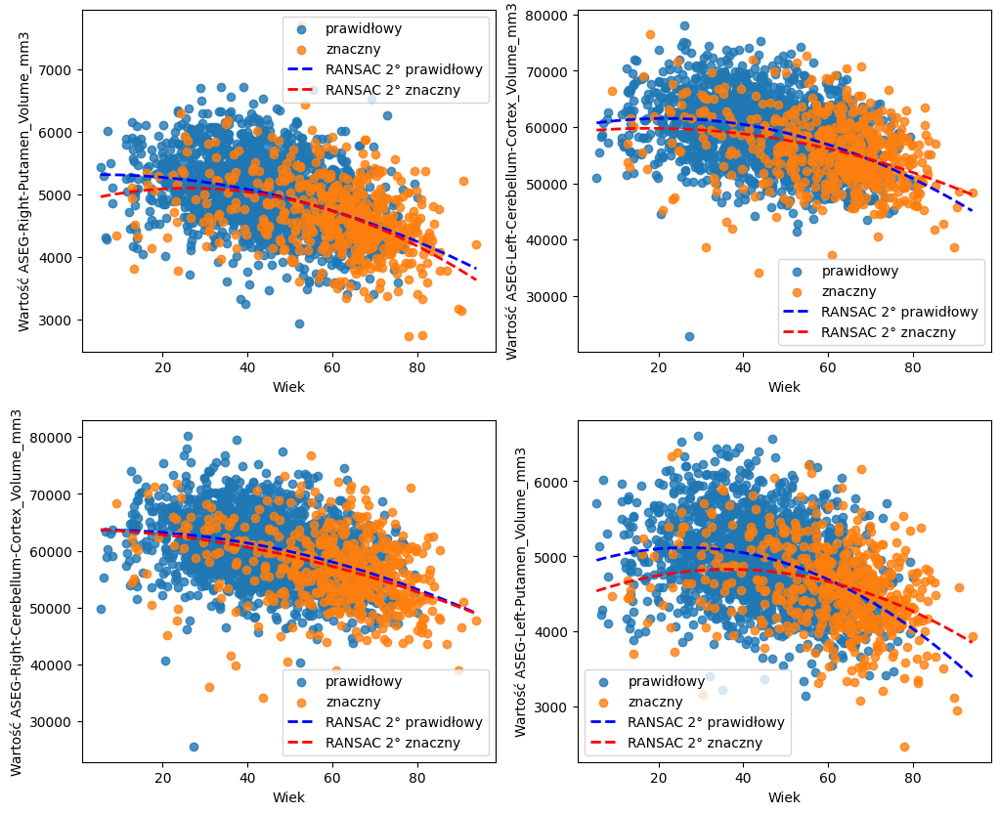

In [55]:

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_umiarkowany, 'znaczny',
            'ASEG-Right-Putamen_Volume_mm3', sex='M')
plot_struct(axes[0,1], df, df_umiarkowany, 'znaczny',
            'ASEG-Left-Cerebellum-Cortex_Volume_mm3', sex='M')
plot_struct(axes[1,0], df, df_umiarkowany, 'znaczny',
            'ASEG-Right-Cerebellum-Cortex_Volume_mm3', sex='M')
plot_struct(axes[1,1], df, df_umiarkowany, 'znaczny',
            'ASEG-Left-Putamen_Volume_mm3', sex='M')

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

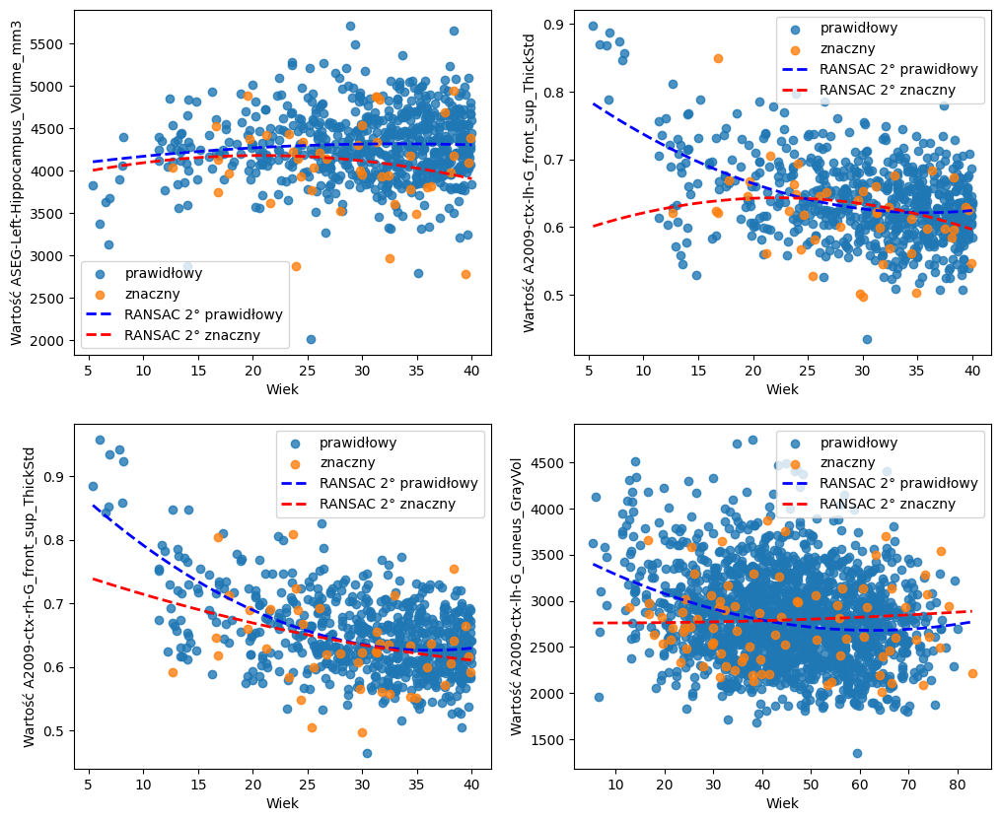

In [62]:
df_gleboki_filtered = df_gleboki[(df_gleboki['age'] >= 0) & (df_gleboki['age'] <= 40)]
df_filtered = df[(df['age'] >= 0) & (df['age'] <= 40)]

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df_filtered, df_gleboki_filtered, 'znaczny',
            'ASEG-Left-Hippocampus_Volume_mm3', sex='M')
plot_struct(axes[0,1], df_filtered, df_gleboki_filtered, 'znaczny',
            'A2009-ctx-lh-G_front_sup_ThickStd', sex='M')
plot_struct(axes[1,0], df_filtered, df_gleboki_filtered, 'znaczny',
            'A2009-ctx-rh-G_front_sup_ThickStd', sex='M')
plot_struct(axes[1,1], df, df_gleboki, 'znaczny',
            'A2009-ctx-lh-G_cuneus_GrayVol', sex='M')

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

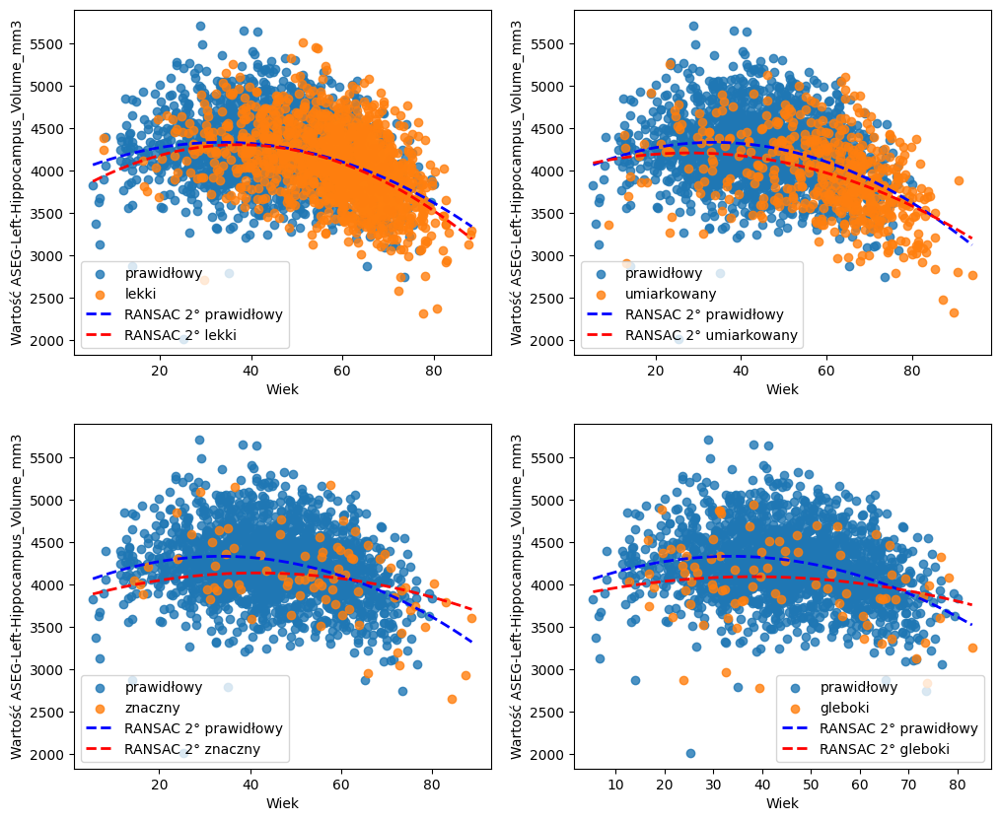

In [60]:
struct='ASEG-Left-Hippocampus_Volume_mm3'

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_lekki, 'lekki',
            struct, sex='M')
plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            struct, sex='M')
plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            struct, sex='M')
plot_struct(axes[1,1], df, df_gleboki, 'gleboki',
            struct, sex='M')

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

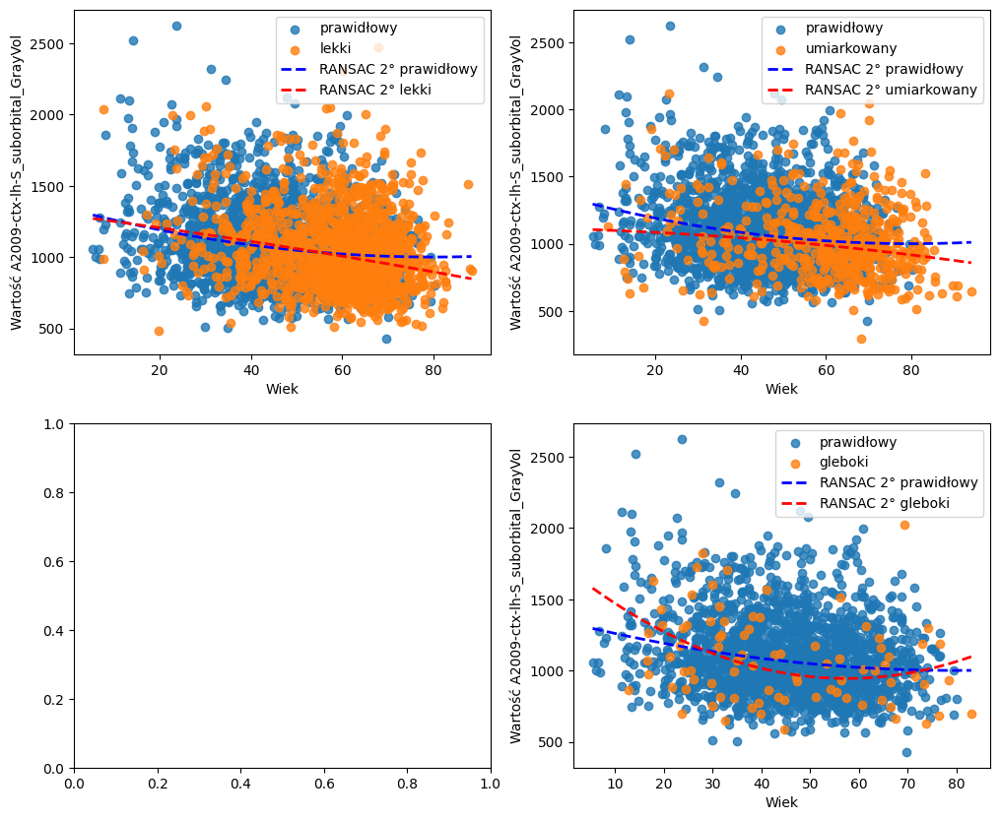

In [ ]:
struct='A2009-ctx-lh-S_suborbital_GrayVol'

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_lekki, 'lekki',
            struct, sex='M')
plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            struct, sex='M')

plot_struct(axes[1,1], df, df_gleboki, 'gleboki',
            struct, sex='M')

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

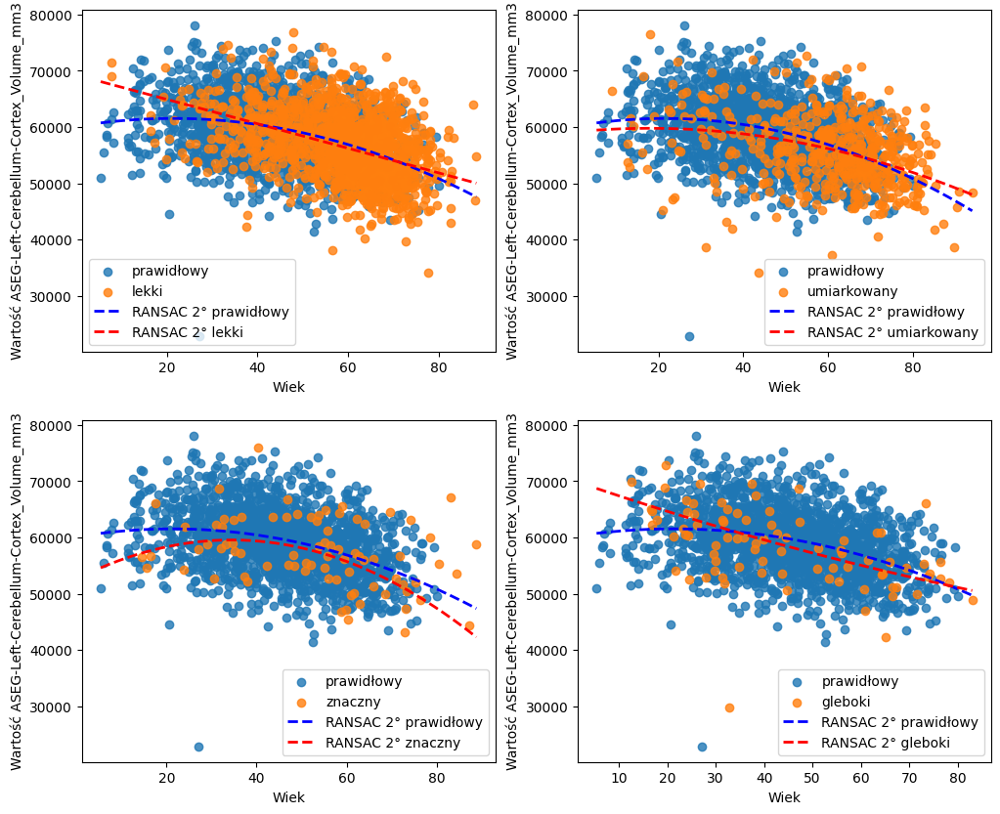

In [66]:
struct='A2009-ctx-rh-G_temp_sup-Plan_tempo_ThickAvg'
struct='A2009-ctx-lh-G_front_middle_ThickAvg'
struct='A2009-ctx-rh-G_temp_sup-Plan_tempo_ThickAvg'
struct='ASEG-Left-Cerebellum-Cortex_Volume_mm3'

#struct='A2009-ctx-lh-G_and_S_cingul-Mid-Ant_ThickAvg'
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_lekki, 'lekki',
            struct, sex='M')
plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            struct, sex='M')
plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            struct, sex='M')
plot_struct(axes[1,1], df, df_gleboki, 'gleboki',
            struct, sex='M')

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

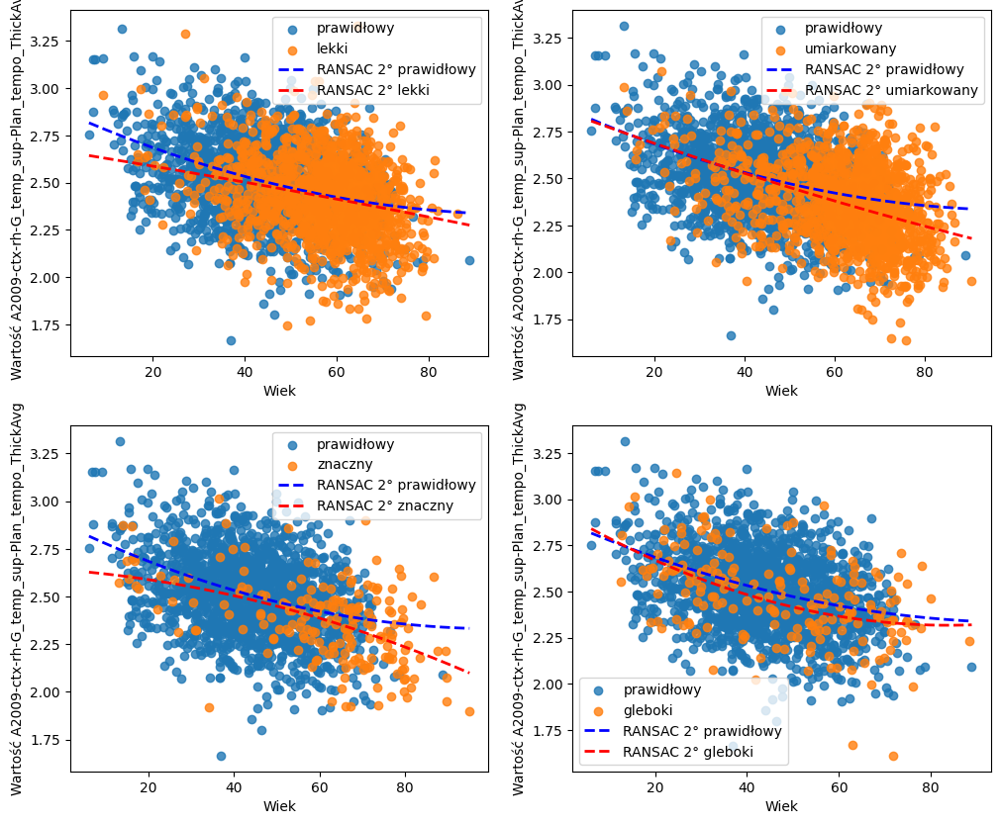

In [10]:
struct='A2009-ctx-rh-G_temp_sup-Plan_tempo_ThickAvg'
struct='A2009-ctx-lh-G_front_middle_ThickAvg'
struct='A2009-ctx-rh-G_temp_sup-Plan_tempo_ThickAvg'
#struct='A2009-ctx-lh-G_and_S_cingul-Mid-Ant_ThickAvg'
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_lekki, 'lekki',
            struct, sex='F')
plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            struct, sex='F')
plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            struct, sex='F')
plot_struct(axes[1,1], df, df_gleboki, 'gleboki',
            struct, sex='F')

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

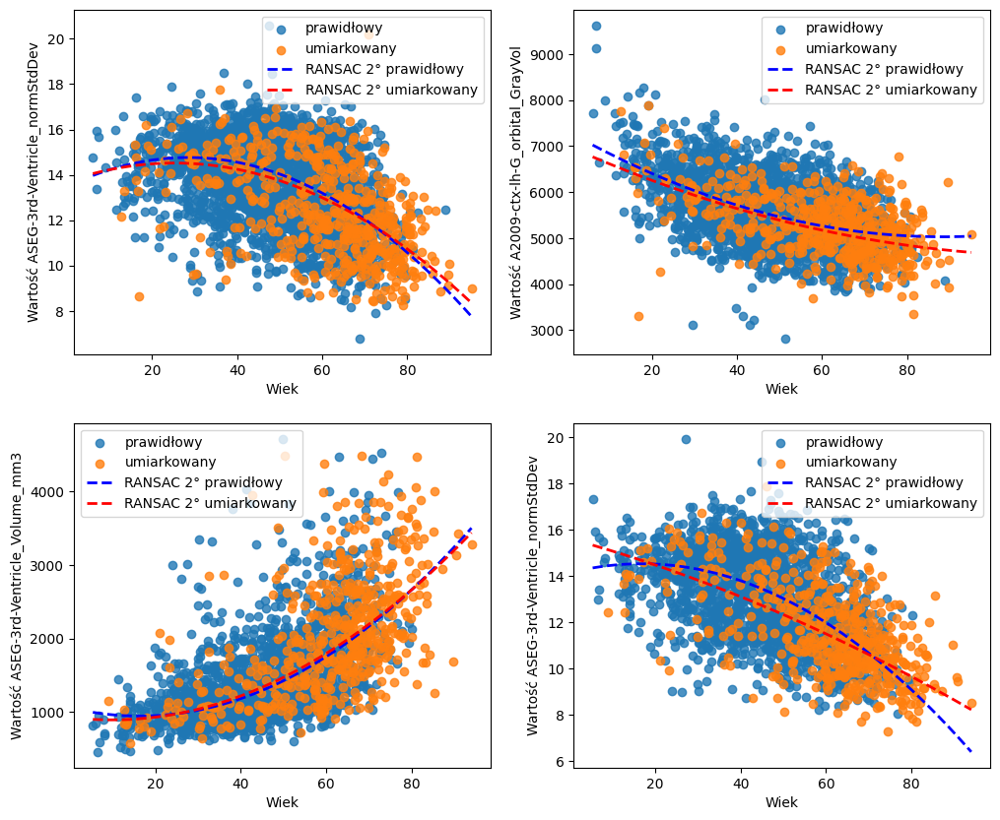

In [39]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_umiarkowany, 'umiarkowany',
            'ASEG-3rd-Ventricle_normStdDev', sex='F')
plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-G_orbital_GrayVol', sex='F')
plot_struct(axes[1,0], df, df_umiarkowany, 'umiarkowany',
            'ASEG-3rd-Ventricle_Volume_mm3', sex='M')
plot_struct(axes[1,1], df, df_umiarkowany, 'umiarkowany',
            'ASEG-3rd-Ventricle_normStdDev', sex='M')

/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature nam

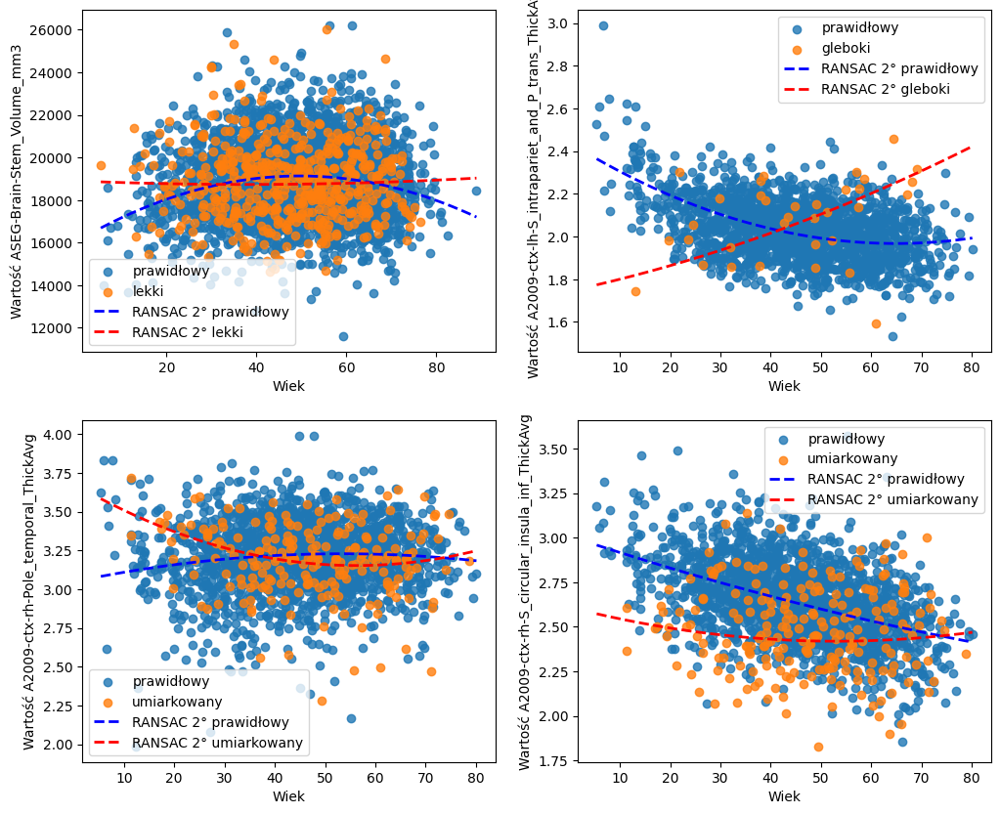

In [56]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'ASEG-Brain-Stem_Volume_mm3', sex='F')
plot_struct(axes[0,1], df, df_gleboki, 'gleboki',
            'A2009-ctx-lh-S_intrapariet_and_P_trans_ThickAvg', sex='M')
plot_struct(axes[1,0], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-rh-Pole_temporal_ThickAvg', sex='M')
plot_struct(axes[1,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-rh-S_circular_insula_inf_ThickAvg', sex='M')

/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature nam

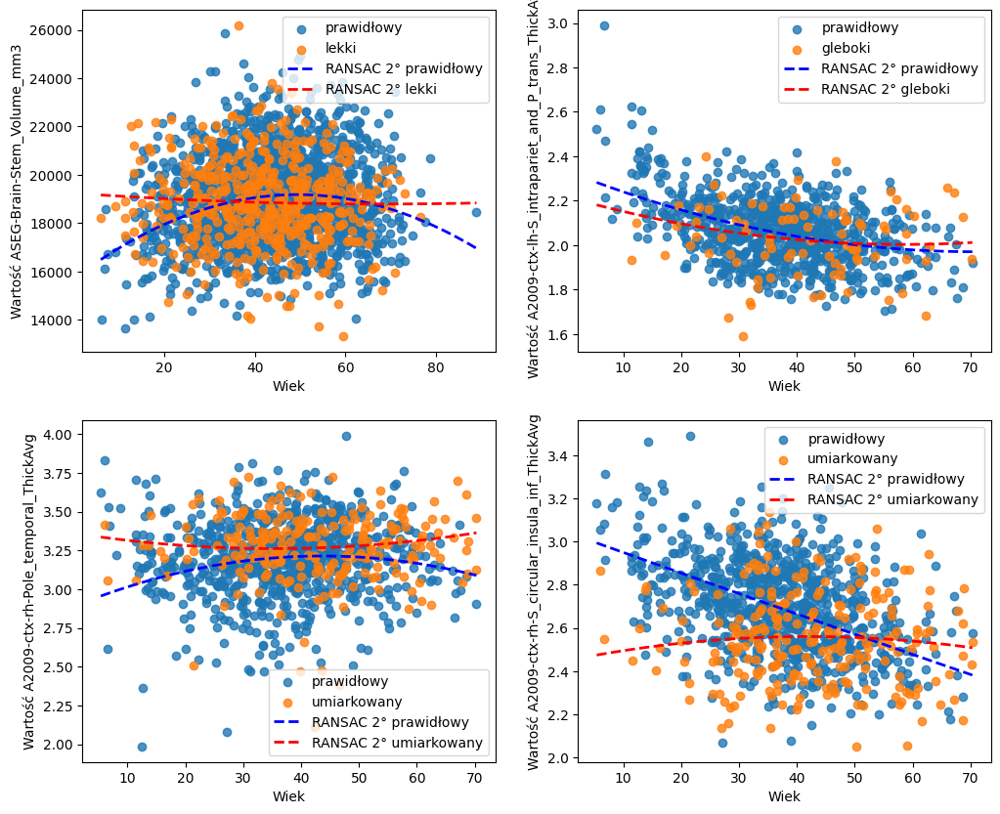

In [25]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'ASEG-Brain-Stem_Volume_mm3', sex='F')
plot_struct(axes[0,1], df, df_gleboki, 'gleboki',
            'A2009-ctx-lh-S_intrapariet_and_P_trans_ThickAvg', sex='M')
plot_struct(axes[1,0], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-rh-Pole_temporal_ThickAvg', sex='M')
plot_struct(axes[1,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-rh-S_circular_insula_inf_ThickAvg', sex='M')

/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature nam

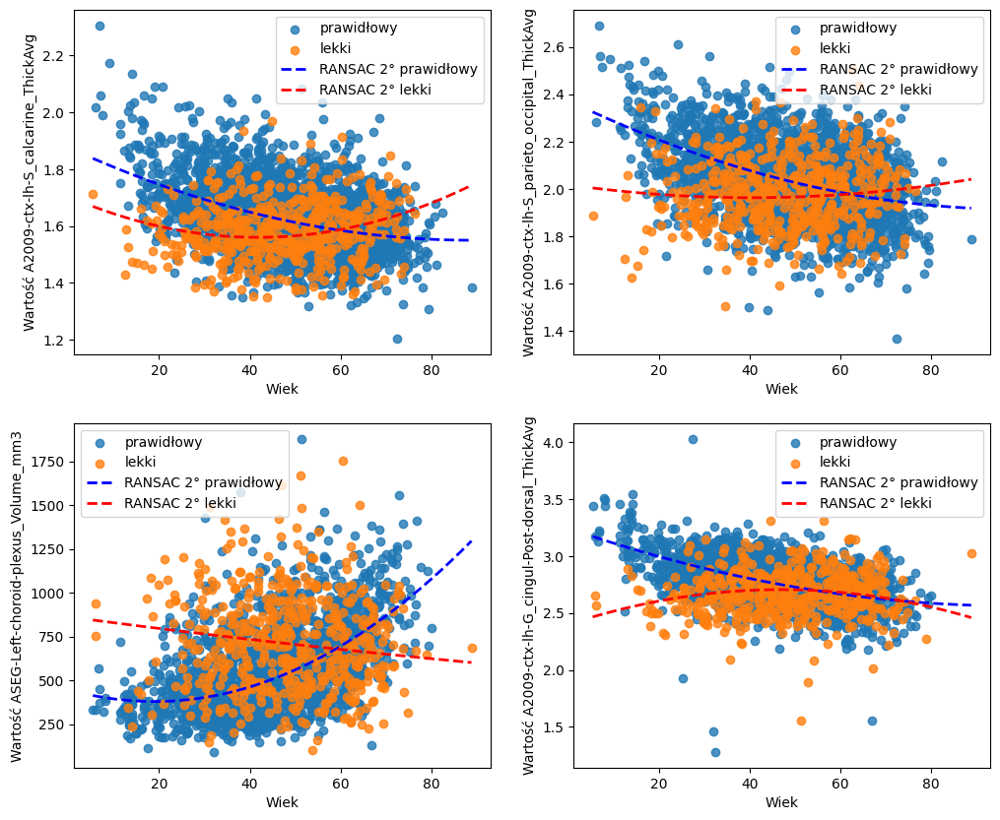

In [8]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-S_calcarine_ThickAvg', sex='F')
plot_struct(axes[0,1], df, df_lekki, 'lekki',
            'A2009-ctx-lh-S_parieto_occipital_ThickAvg', sex='F')
plot_struct(axes[1,0], df, df_lekki, 'lekki',
            'ASEG-Left-choroid-plexus_Volume_mm3', sex='M')
plot_struct(axes[1,1], df, df_lekki, 'lekki',
            'A2009-ctx-lh-G_cingul-Post-dorsal_ThickAvg', sex='M')

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

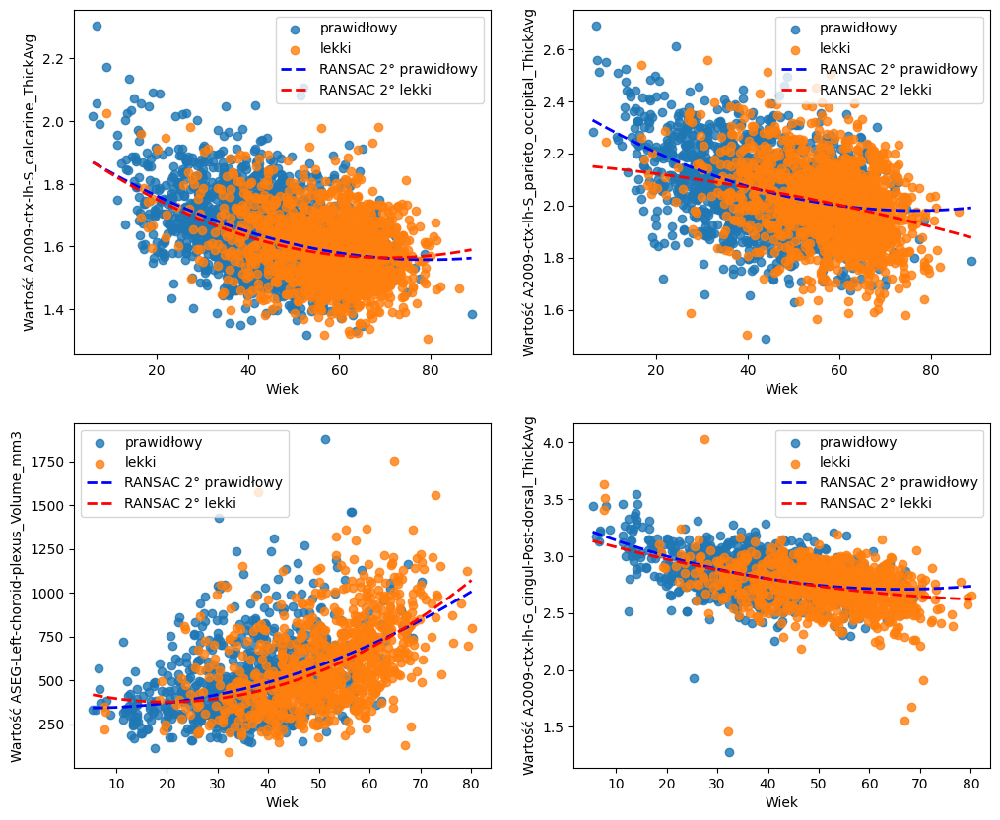

In [ ]:
#hf
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-S_calcarine_ThickAvg', sex='F')
plot_struct(axes[0,1], df, df_lekki, 'lekki',
            'A2009-ctx-lh-S_parieto_occipital_ThickAvg', sex='F')
plot_struct(axes[1,0], df, df_lekki, 'lekki',
            'ASEG-Left-choroid-plexus_Volume_mm3', sex='M')
plot_struct(axes[1,1], df, df_lekki, 'lekki',
            'A2009-ctx-lh-G_cingul-Post-dorsal_ThickAvg', sex='M')

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

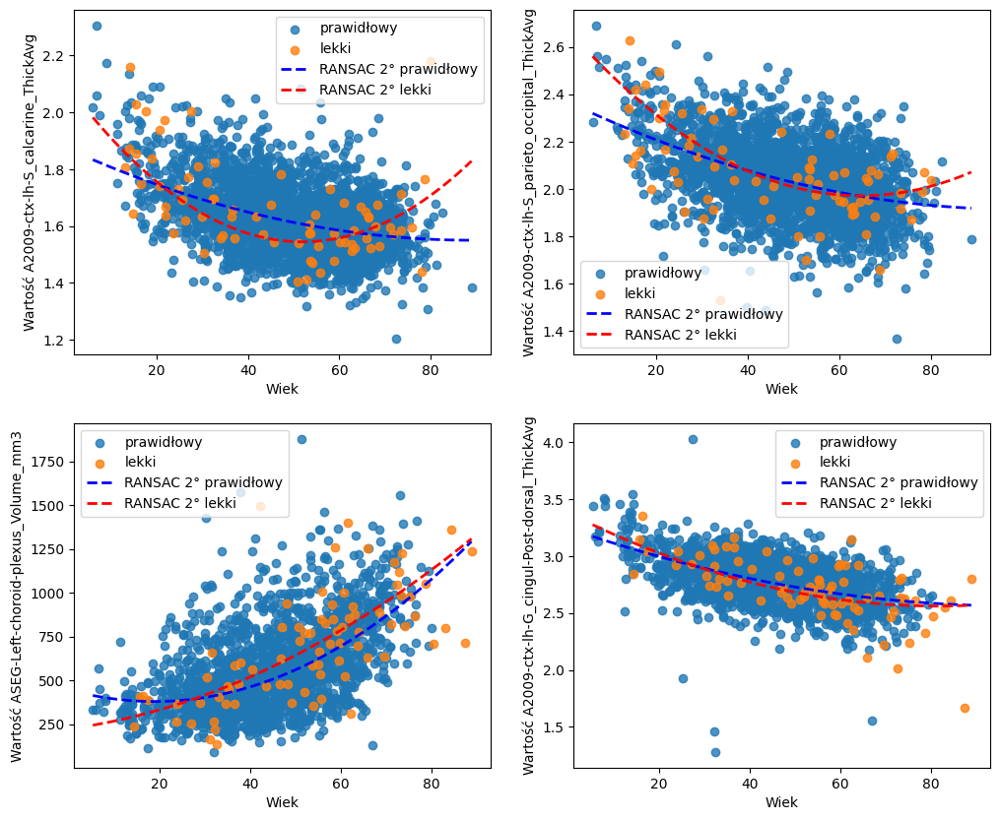

In [68]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_znaczny, 'lekki',
            'A2009-ctx-lh-S_calcarine_ThickAvg', sex='F')
plot_struct(axes[0,1], df, df_znaczny, 'lekki',
            'A2009-ctx-lh-S_parieto_occipital_ThickAvg', sex='F')
plot_struct(axes[1,0], df, df_znaczny, 'lekki',
            'ASEG-Left-choroid-plexus_Volume_mm3', sex='M')
plot_struct(axes[1,1], df, df_znaczny, 'lekki',
            'A2009-ctx-lh-G_cingul-Post-dorsal_ThickAvg', sex='M')

/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_machine_learning/.venv/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/Documents/GitHub/MRI_m

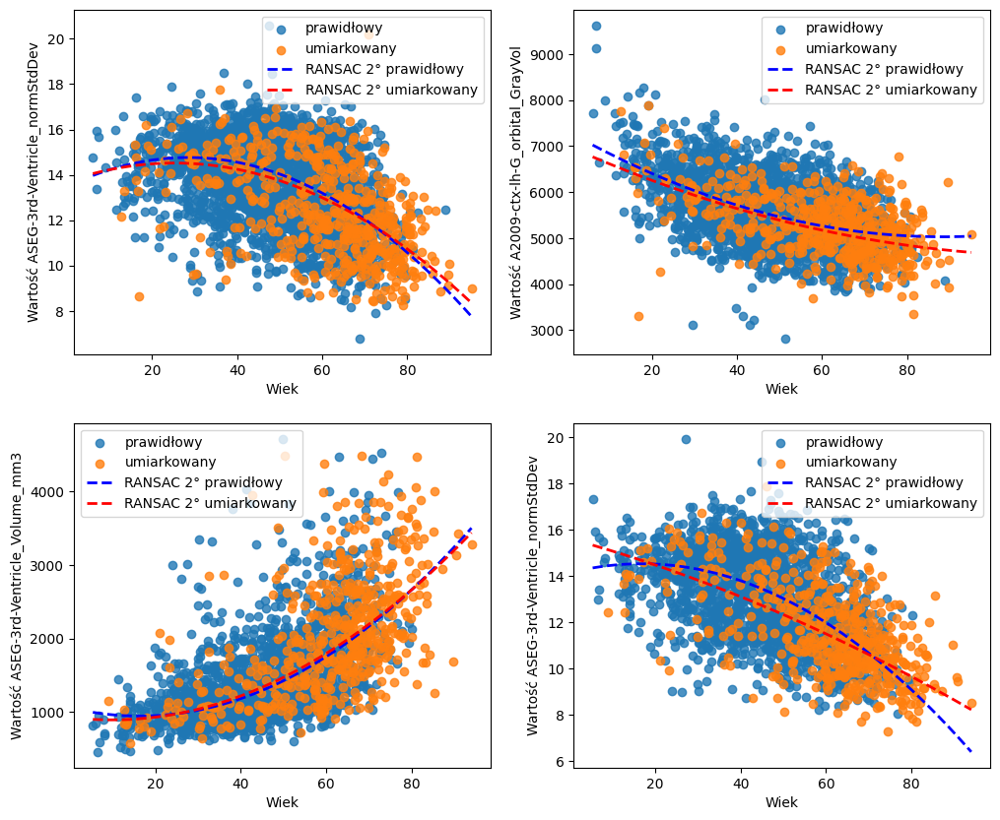

In [40]:
#mf
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_umiarkowany, 'umiarkowany',
            'ASEG-3rd-Ventricle_normStdDev', sex='F')
plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-G_orbital_GrayVol', sex='F')
plot_struct(axes[1,0], df, df_umiarkowany, 'umiarkowany',
            'ASEG-3rd-Ventricle_Volume_mm3', sex='M')
plot_struct(axes[1,1], df, df_umiarkowany, 'umiarkowany',
            'ASEG-3rd-Ventricle_normStdDev', sex='M')

Huber coef (norm): [-0.05480078]
Huber coef (hearing): [0.01874386]
Huber coef (norm): [-23.30115276]
Huber coef (hearing): [4.89271913]
Huber coef (norm): [19.88749053]
Huber coef (hearing): [6.00966081]
Huber coef (norm): [-0.06795125]
Huber coef (hearing): [-0.01558314]


/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(


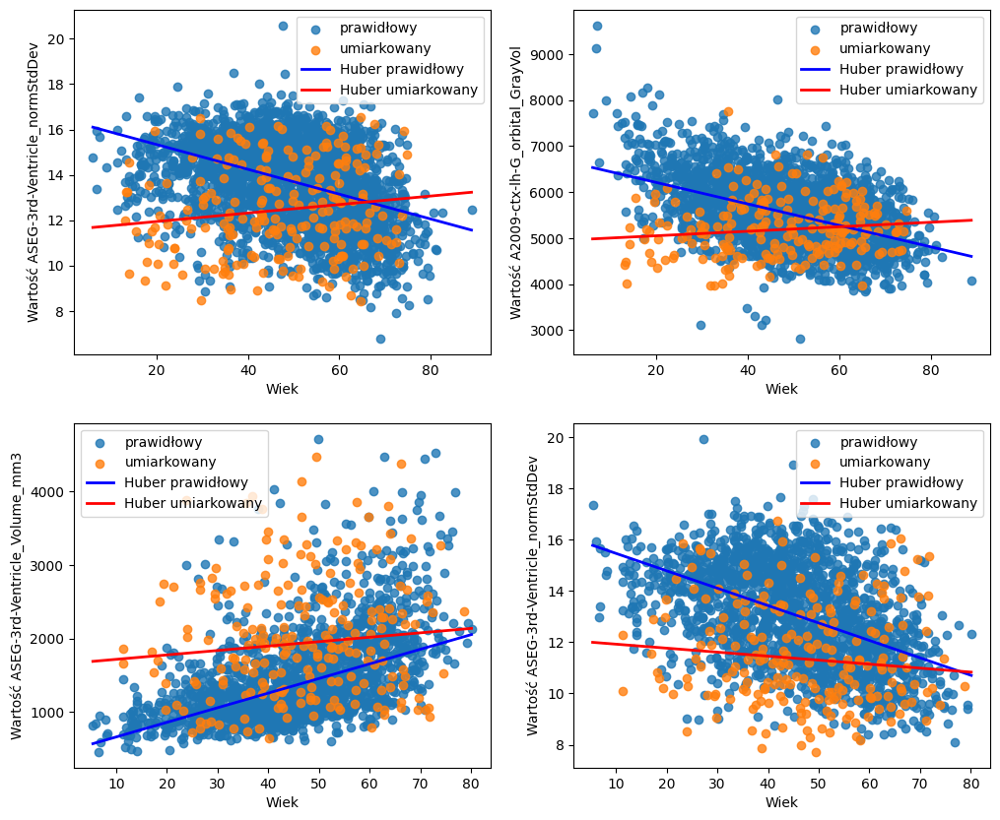

In [74]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_umiarkowany, 'umiarkowany',
            'ASEG-3rd-Ventricle_normStdDev', sex='F')
plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-G_orbital_GrayVol', sex='F')
plot_struct(axes[1,0], df, df_umiarkowany, 'umiarkowany',
            'ASEG-3rd-Ventricle_Volume_mm3', sex='M')
plot_struct(axes[1,1], df, df_umiarkowany, 'umiarkowany',
            'ASEG-3rd-Ventricle_normStdDev', sex='M')

Huber coef (norm): [-0.00102626]
Huber coef (hearing): [-0.01059791]
Huber coef (norm): [0.00058022]
Huber coef (hearing): [0.00119876]
Huber coef (norm): [19.88749053]
Huber coef (hearing): [13.09857833]
Huber coef (norm): [-0.06795125]
Huber coef (hearing): [-0.02625944]


/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(


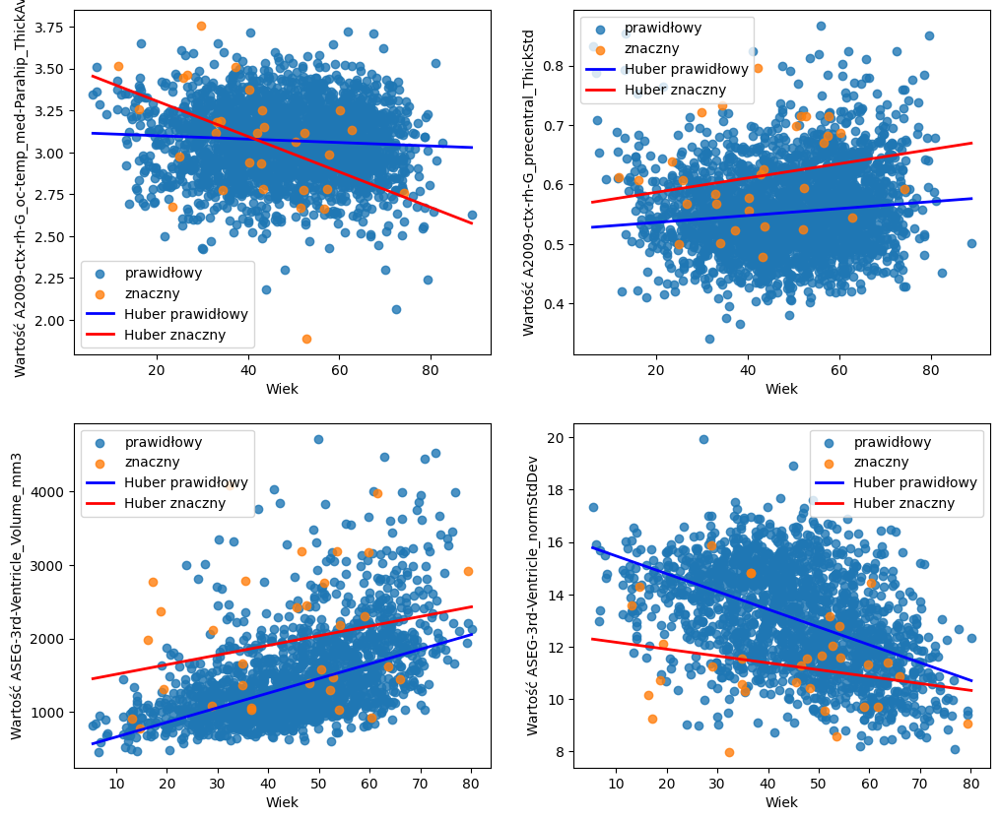

In [76]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-rh-G_oc-temp_med-Parahip_ThickAvg', sex='F')
plot_struct(axes[0,1], df, df_znaczny, 'znaczny',
            'A2009-ctx-rh-G_precentral_ThickStd', sex='F')
plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'ASEG-3rd-Ventricle_Volume_mm3', sex='M')
plot_struct(axes[1,1], df, df_znaczny, 'znaczny',
            'ASEG-3rd-Ventricle_normStdDev', sex='M')

Huber coef (norm): [-0.04410708]
Huber coef (hearing): [0.02835411]
Huber coef (norm): [-0.08506754]
Huber coef (hearing): [0.07831755]
Huber coef (norm): [-0.00768578]
Huber coef (hearing): [0.01137224]
Huber coef (norm): [-0.00378027]
Huber coef (hearing): [0.00610239]


/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(


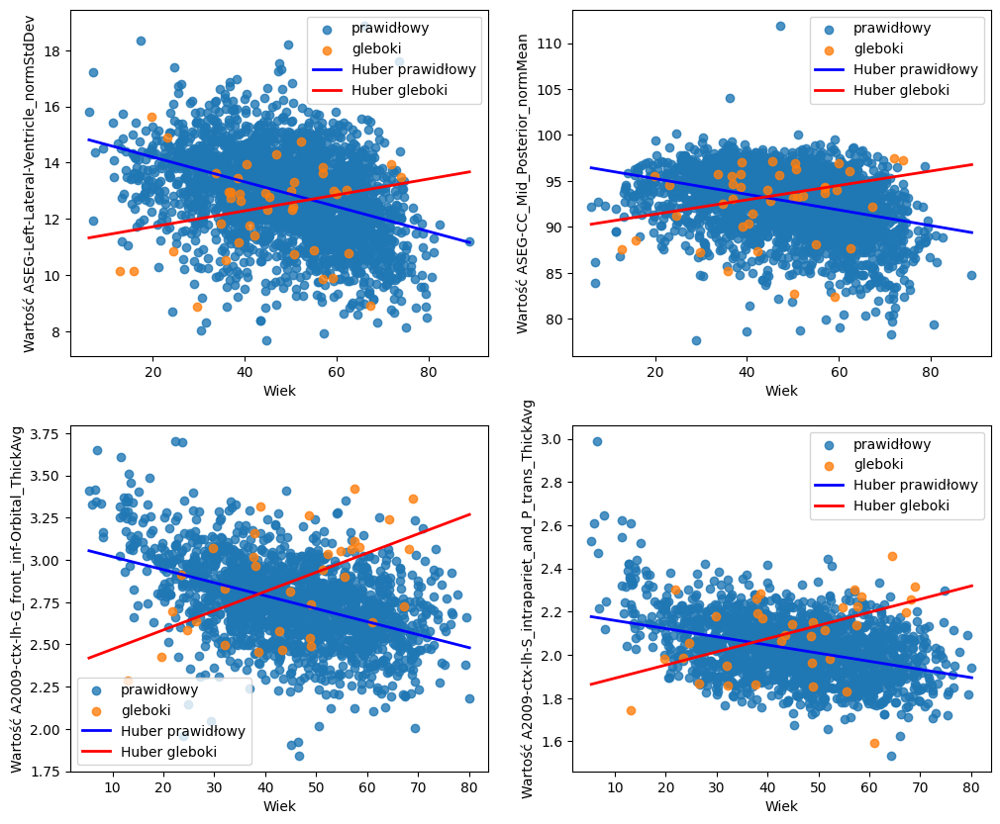

In [79]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_gleboki, 'gleboki',
            'ASEG-Left-Lateral-Ventricle_normStdDev', sex='F')
plot_struct(axes[0,1], df, df_gleboki, 'gleboki',
            'ASEG-CC_Mid_Posterior_normMean', sex='F')
plot_struct(axes[1,0], df, df_gleboki, 'gleboki',
            'A2009-ctx-lh-G_front_inf-Orbital_ThickAvg', sex='M')
plot_struct(axes[1,1], df, df_gleboki, 'gleboki',
            'A2009-ctx-lh-S_intrapariet_and_P_trans_ThickAvg', sex='M')

/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


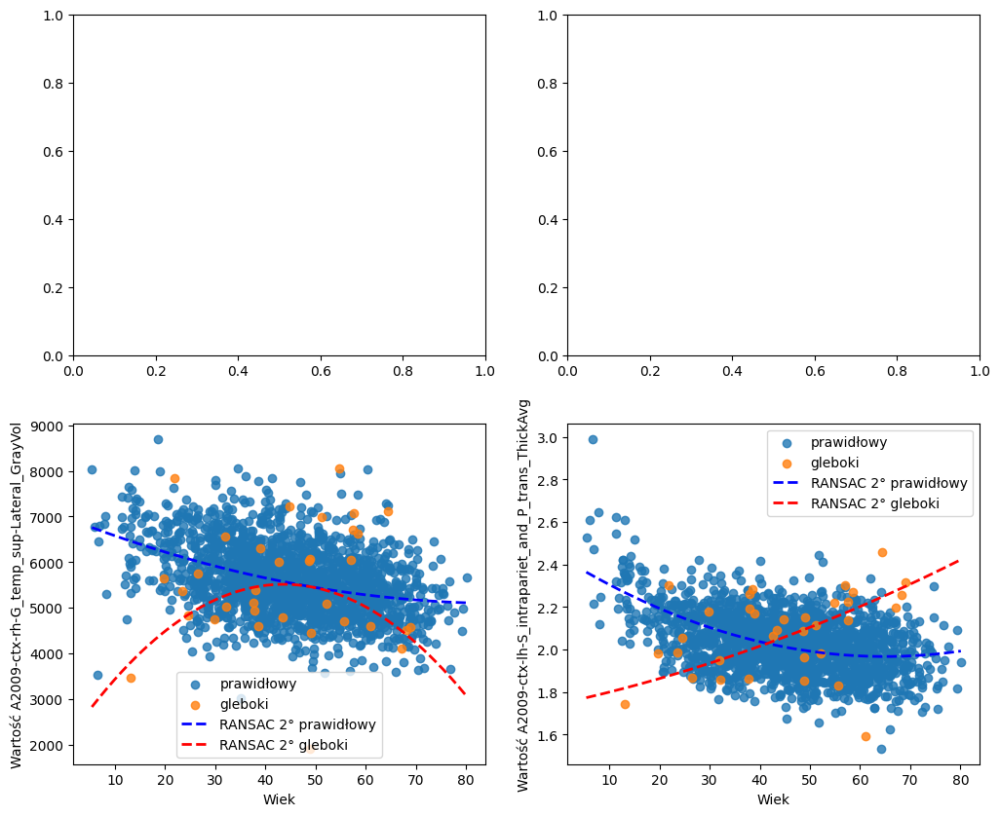

In [17]:

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[1,0], df, df_gleboki, 'gleboki',
            'A2009-ctx-rh-G_temp_sup-Lateral_GrayVol', sex='M')
plot_struct(axes[1,1], df, df_gleboki, 'gleboki',
            'A2009-ctx-lh-S_intrapariet_and_P_trans_ThickAvg', sex='M')

Huber coef (norm): [-0.0008578]
Huber coef (hearing): [0.01440144]


/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(


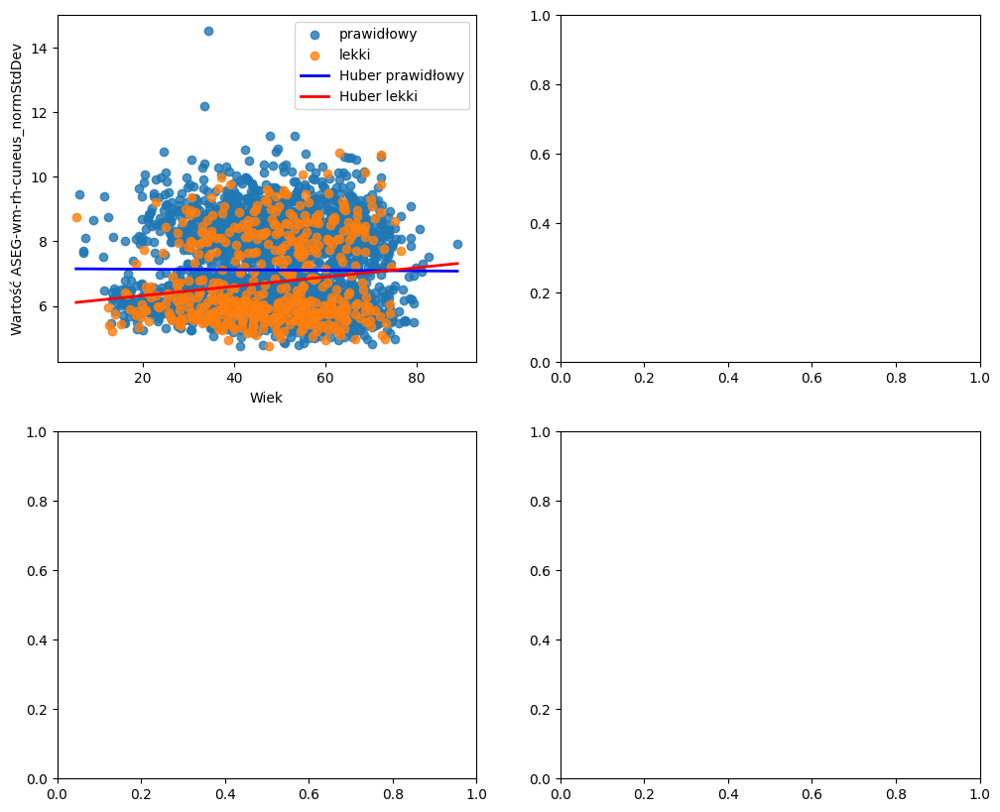

In [83]:

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'ASEG-wm-rh-cuneus_normStdDev', sex='F')

Huber coef (norm): [-0.00707189]
Huber coef (hearing): [0.00298152]
Huber coef (norm): [6.37863054e-05]
Huber coef (hearing): [-0.01457852]


/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(


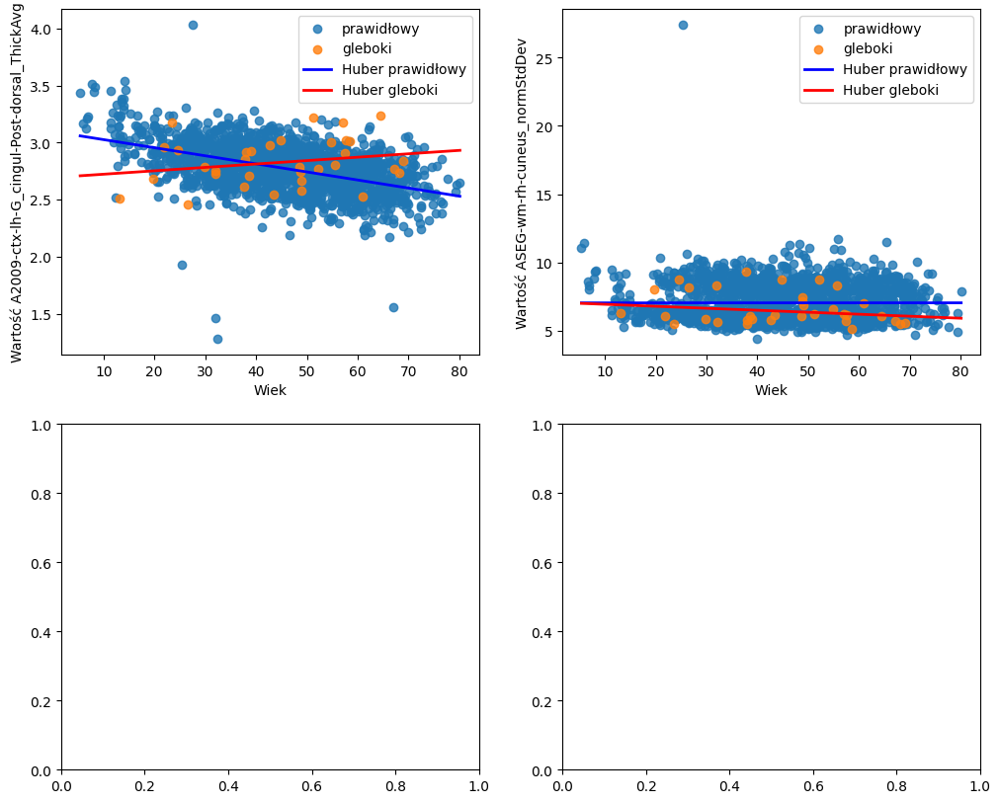

In [64]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_gleboki, 'gleboki',
            'A2009-ctx-lh-G_cingul-Post-dorsal_ThickAvg', sex='M')
plot_struct(axes[0,1], df, df_gleboki, 'gleboki',
            'ASEG-wm-rh-cuneus_normStdDev', sex='M')

Huber coef (norm): [8.68048808]
Huber coef (hearing): [-0.44218605]
Huber coef (norm): [-0.00707189]
Huber coef (hearing): [0.00091583]
Huber coef (norm): [-0.00356391]
Huber coef (hearing): [0.00092908]
Huber coef (norm): [-0.0046258]
Huber coef (hearing): [0.00063514]


/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(


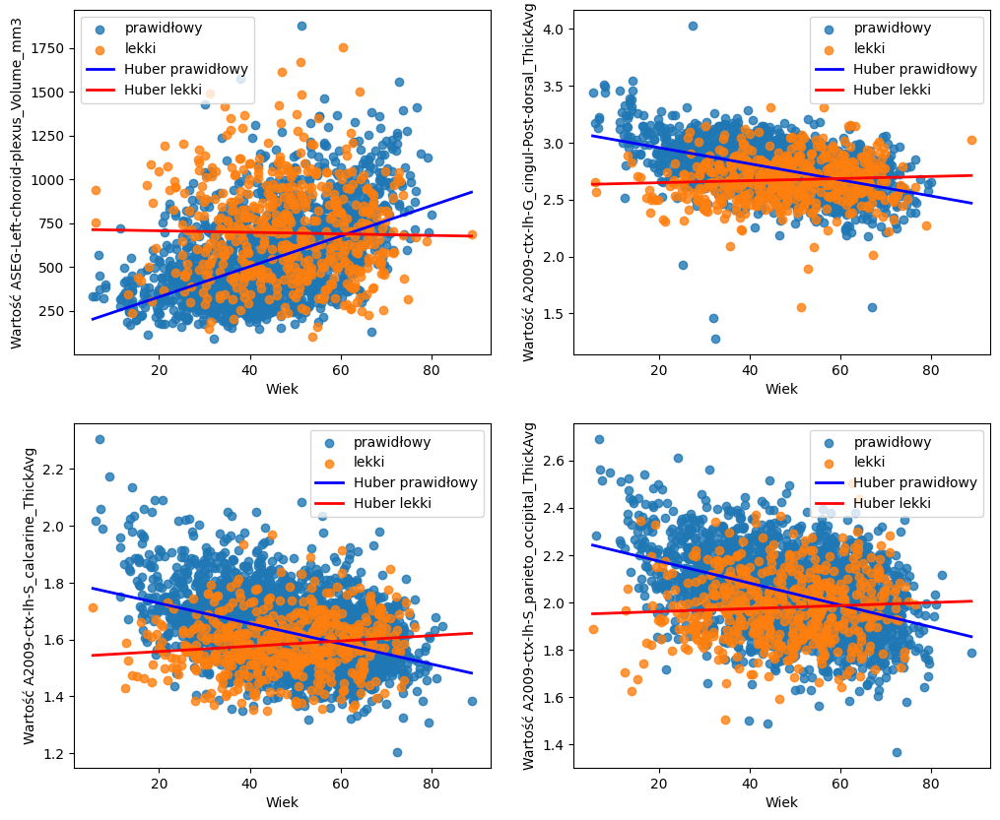

In [63]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'ASEG-Left-choroid-plexus_Volume_mm3', sex='M')
plot_struct(axes[0,1], df, df_lekki, 'lekki',
            'A2009-ctx-lh-G_cingul-Post-dorsal_ThickAvg', sex='M')
plot_struct(axes[1,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-S_calcarine_ThickAvg', sex='F')
plot_struct(axes[1,1], df, df_lekki, 'lekki',
            'A2009-ctx-lh-S_parieto_occipital_ThickAvg', sex='F')
#plot_struct(axes[0,1], df, df_gleboki, 'gleboki',
#            'ASEG-Left-Lateral-Ventricle_normStdDev', sex='F')
#plot_struct(axes[1,0], df, df_gleboki, 'gleboki',
#            'A2009-ctx-lh-G_front_inf-Orbital_ThickAvg', sex='M')
#plot_struct(axes[1,1], df, df_gleboki, 'gleboki',
#            'A2009-ctx-lh-G_front_inf-Orbital_ThickAvg', sex='F')

/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


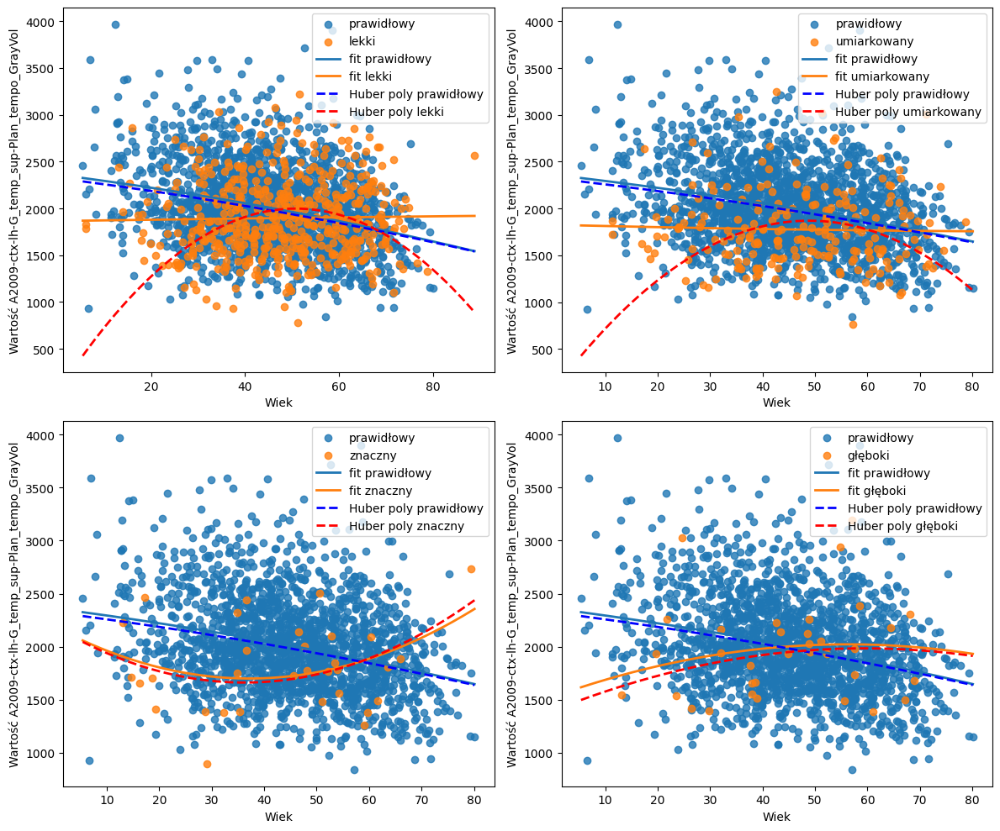

In [34]:
#dyskryminacja dziwekow mowy
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')

plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')

plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')

plot_struct(axes[1,1], df, df_gleboki, 'głęboki',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')

plt.tight_layout()
plt.show()


/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature nam

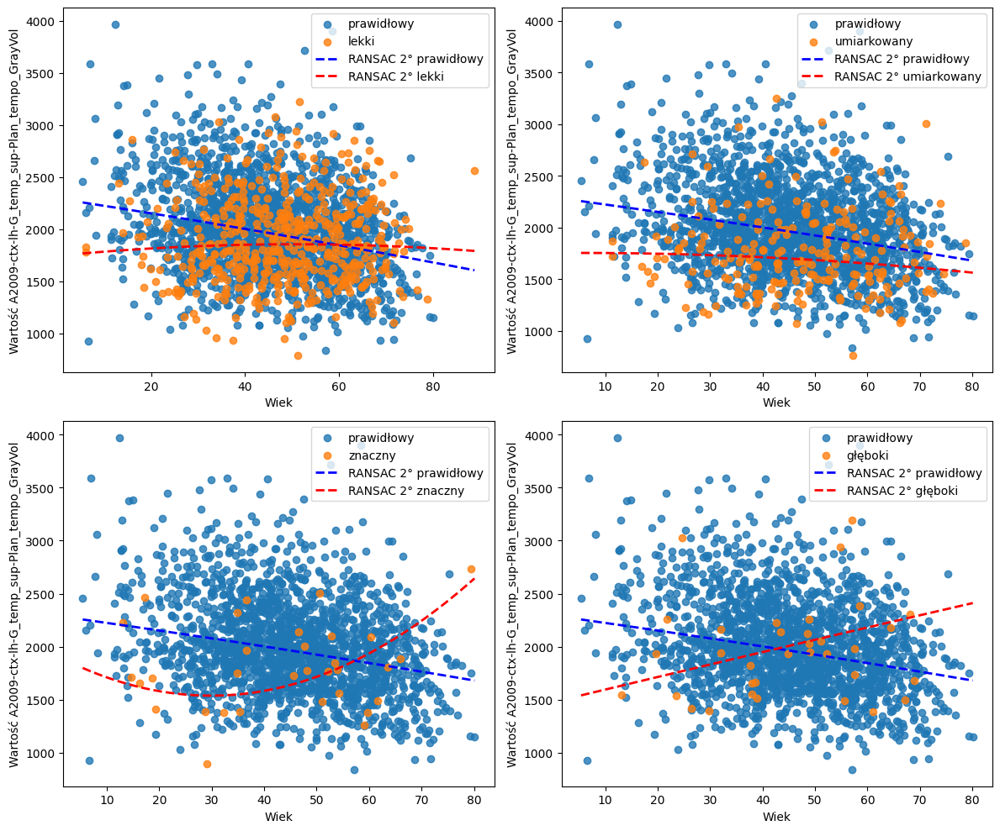

In [9]:
#dyskryminacja dziwekow mowy
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')

plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')

plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')

plot_struct(axes[1,1], df, df_gleboki, 'głęboki',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')

plt.tight_layout()
plt.show()


/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


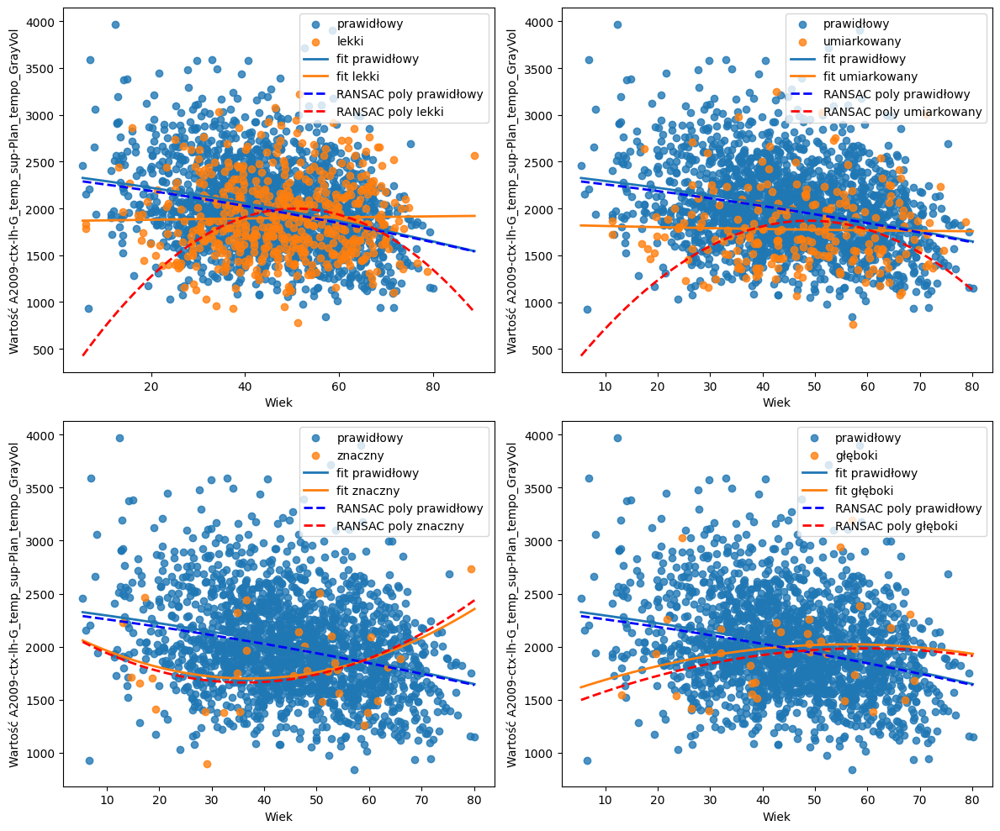

In [32]:
#dyskryminacja dziwekow mowy
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')

plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')

plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')

plot_struct(axes[1,1], df, df_gleboki, 'głęboki',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_GrayVol', sex='M')

plt.tight_layout()
plt.show()


Huber coef (norm): [-0.00656539]
Huber coef (hearing): [-0.00084034]
Huber coef (norm): [-0.00656539]
Huber coef (hearing): [-0.00085887]
Huber coef (norm): [-0.00656539]
Huber coef (hearing): [-0.00224625]
Huber coef (norm): [-0.00656539]
Huber coef (hearing): [0.00289785]


/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(


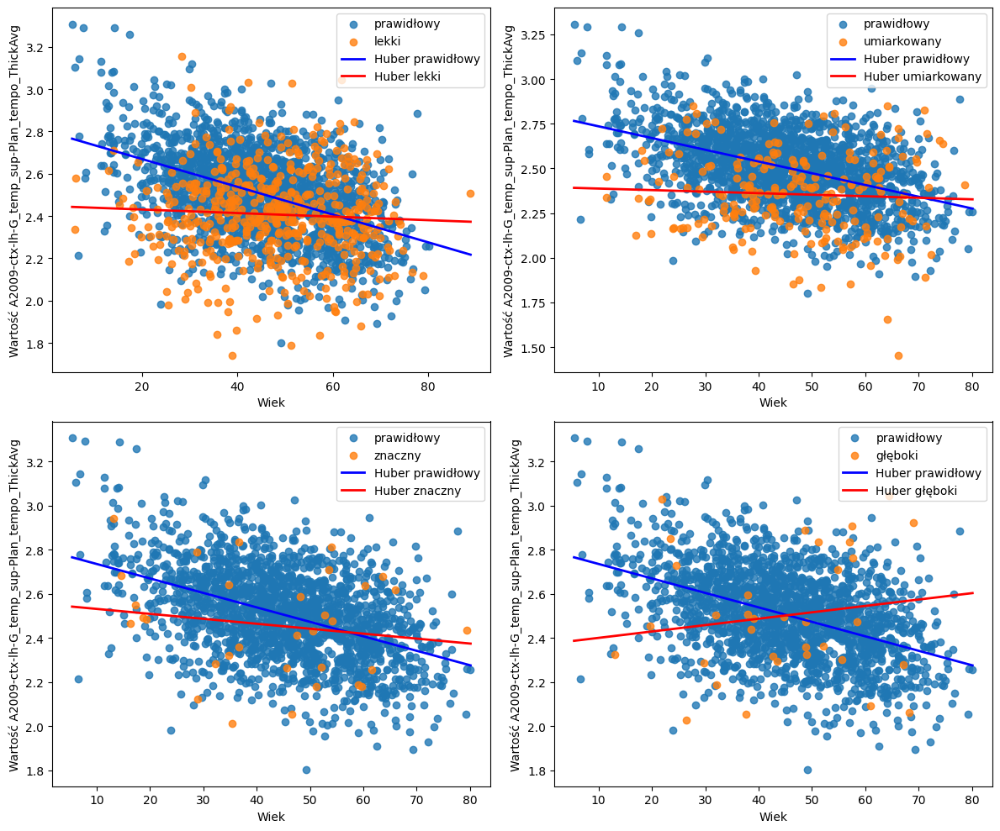

In [57]:
#dyskryminacja dziwekow mowy
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_ThickAvg', sex='M')

plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_ThickAvg', sex='M')

plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_ThickAvg', sex='M')

plot_struct(axes[1,1], df, df_gleboki, 'głęboki',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_ThickAvg', sex='M')

plt.tight_layout()
plt.show()

Huber coef (norm): [-0.00477561]
Huber coef (hearing): [-0.00051673]
Huber coef (norm): [-0.00477561]
Huber coef (hearing): [-0.00035572]
Huber coef (norm): [-0.00477561]
Huber coef (hearing): [-0.00475356]
Huber coef (norm): [-0.00477561]
Huber coef (hearing): [-0.0029239]


/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(


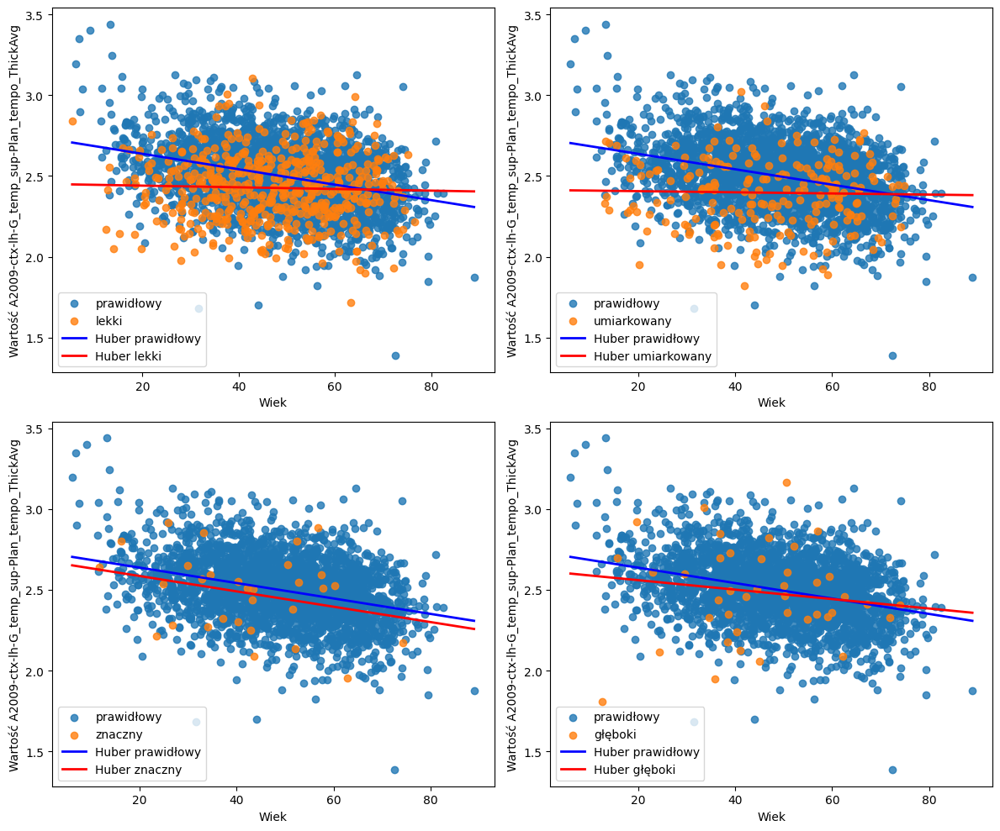

In [42]:
#dyskryminacja dziwekow mowy
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_ThickAvg', sex='F')

plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_ThickAvg', sex='F')

plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_ThickAvg', sex='F')

plot_struct(axes[1,1], df, df_gleboki, 'głęboki',
            'A2009-ctx-lh-G_temp_sup-Plan_tempo_ThickAvg', sex='F')

plt.tight_layout()
plt.show()

Huber coef (norm): [-37.67997526]
Huber coef (hearing): [0.11655497]
Huber coef (norm): [-37.67997526]
Huber coef (hearing): [0.54217058]
Huber coef (norm): [-37.67997526]
Huber coef (hearing): [4.79273085]
Huber coef (norm): [-37.67997526]
Huber coef (hearing): [-9.99223443]


/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(
/home/marysia/.local/lib/python3.11/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but HuberRegressor was fitted with feature names
  warnings.warn(


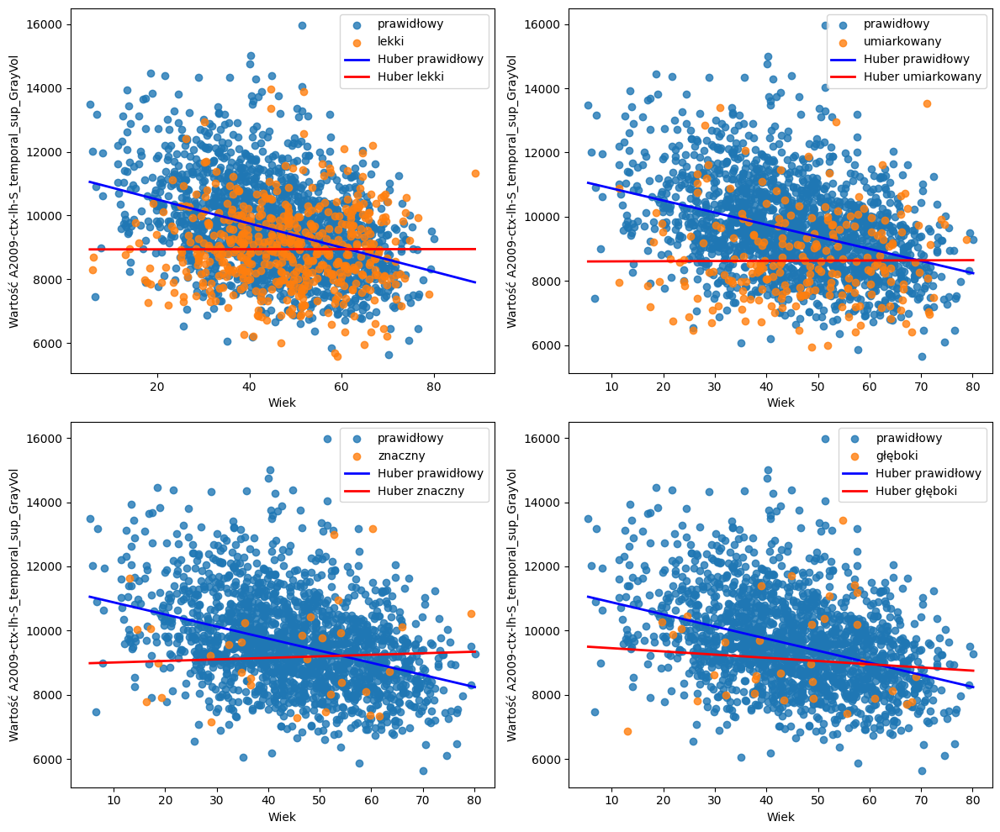

In [43]:
#rozpoznawanie znaczenia wyrazow
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-S_temporal_sup_GrayVol', sex='M')

plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-S_temporal_sup_GrayVol', sex='M')

plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-lh-S_temporal_sup_GrayVol', sex='M')

plot_struct(axes[1,1], df, df_gleboki, 'głęboki',
            'A2009-ctx-lh-S_temporal_sup_GrayVol', sex='M')

plt.tight_layout()
plt.show()

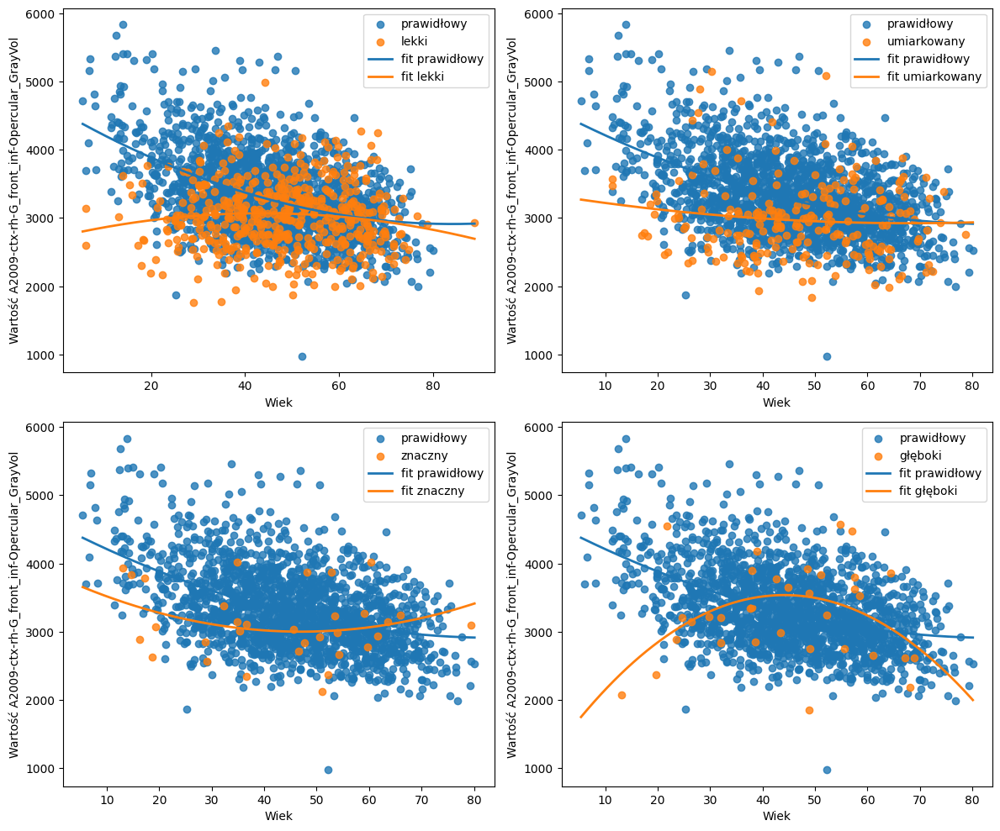

In [22]:
#generowanie mowy, polaczenie ze sluchem
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-rh-G_front_inf-Opercular_GrayVol', sex='M')

plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-rh-G_front_inf-Opercular_GrayVol', sex='M')

plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-rh-G_front_inf-Opercular_GrayVol', sex='M')

plot_struct(axes[1,1], df, df_gleboki, 'głęboki',
            'A2009-ctx-rh-G_front_inf-Opercular_GrayVol', sex='M')

plt.tight_layout()
plt.show()

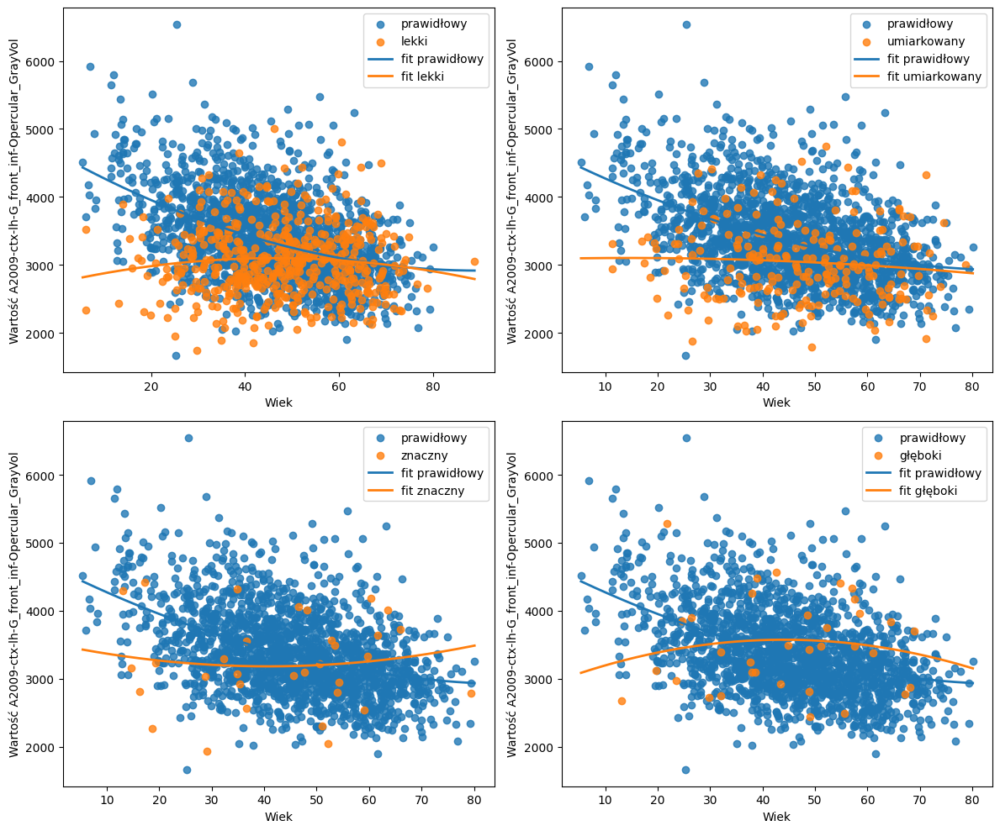

In [24]:
#generowanie mowy, polaczenie ze sluchem
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-G_front_inf-Opercular_GrayVol', sex='M')

plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-G_front_inf-Opercular_GrayVol', sex='M')

plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-lh-G_front_inf-Opercular_GrayVol', sex='M')

plot_struct(axes[1,1], df, df_gleboki, 'głęboki',
            'A2009-ctx-lh-G_front_inf-Opercular_GrayVol', sex='M')

plt.tight_layout()
plt.show()

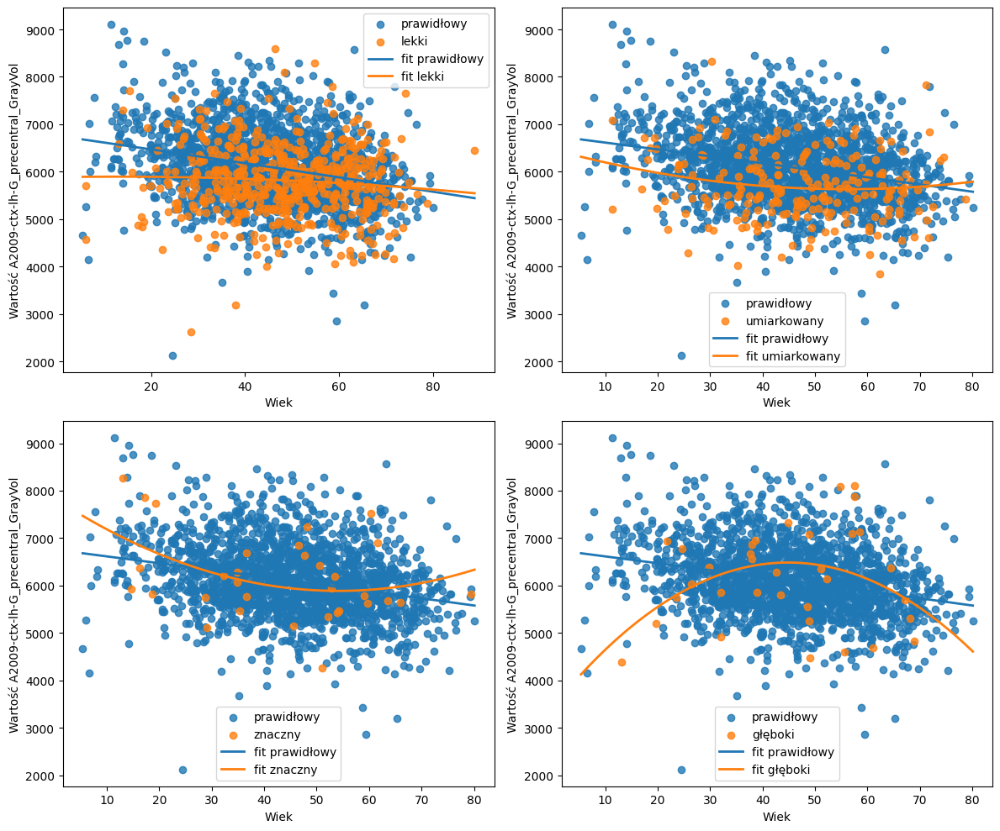

In [25]:
#ruch, planowanie
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-G_precentral_GrayVol', sex='M')

plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-G_precentral_GrayVol', sex='M')

plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-lh-G_precentral_GrayVol', sex='M')

plot_struct(axes[1,1], df, df_gleboki, 'głęboki',
            'A2009-ctx-lh-G_precentral_GrayVol', sex='M')

plt.tight_layout()
plt.show()

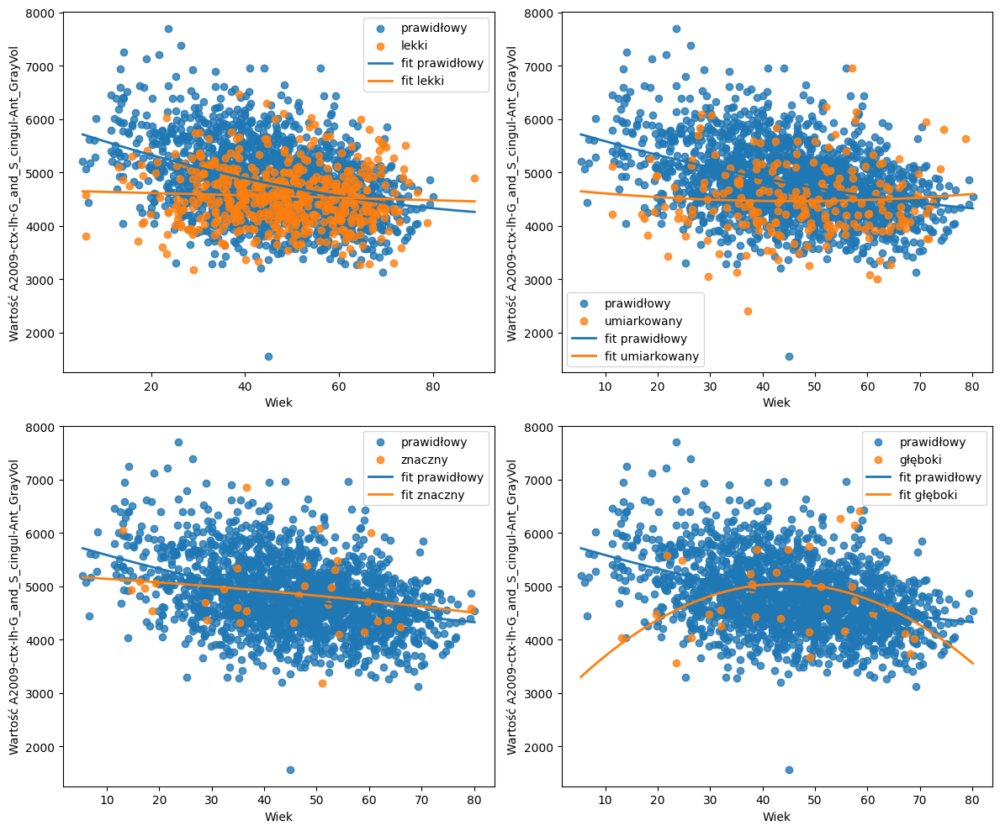

In [27]:
#kontrola wykonywania zadan
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-G_and_S_cingul-Ant_GrayVol', sex='M')

plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-G_and_S_cingul-Ant_GrayVol', sex='M')

plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-lh-G_and_S_cingul-Ant_GrayVol', sex='M')

plot_struct(axes[1,1], df, df_gleboki, 'głęboki',
            'A2009-ctx-lh-G_and_S_cingul-Ant_GrayVol', sex='M')

plt.tight_layout()
plt.show()

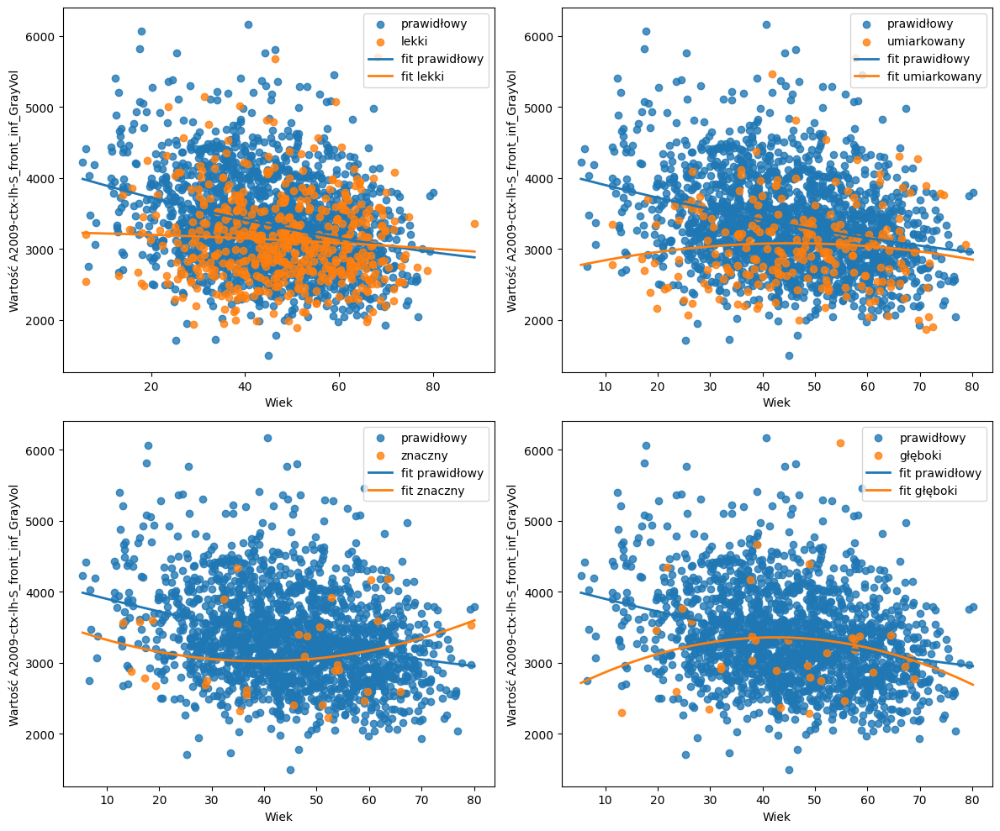

In [28]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-S_front_inf_GrayVol', sex='M')

plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-S_front_inf_GrayVol', sex='M')

plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-lh-S_front_inf_GrayVol', sex='M')

plot_struct(axes[1,1], df, df_gleboki, 'głęboki',
            'A2009-ctx-lh-S_front_inf_GrayVol', sex='M')

plt.tight_layout()
plt.show()

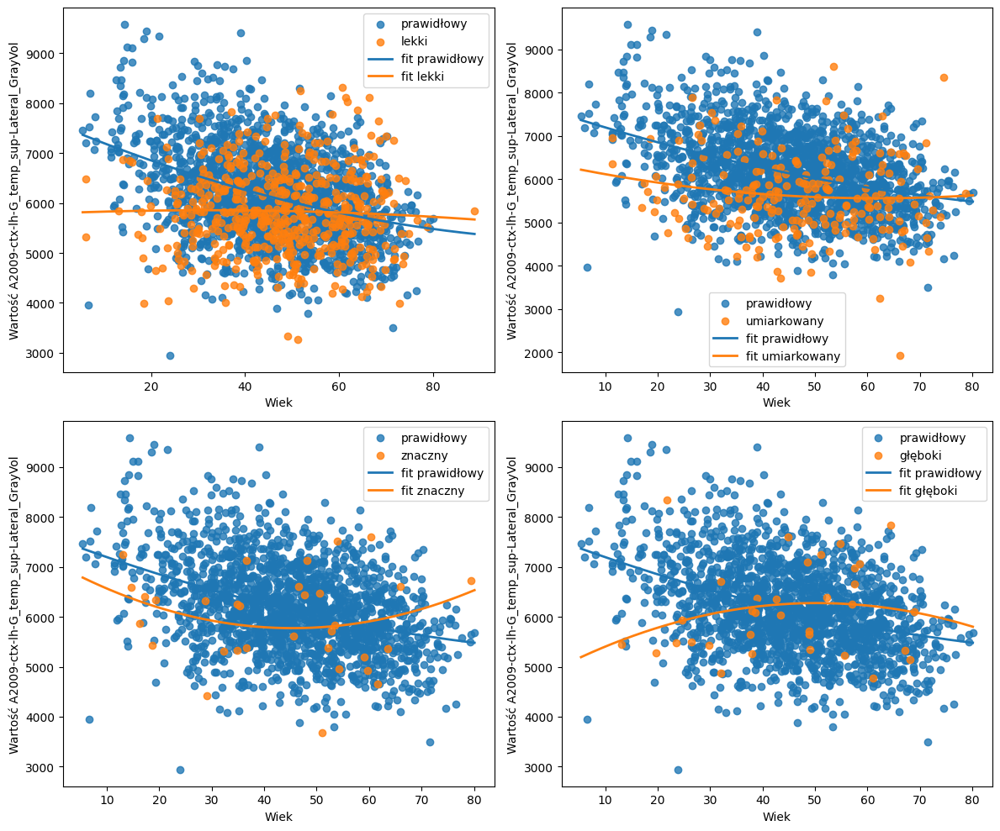

In [29]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

plot_struct(axes[0,0], df, df_lekki, 'lekki',
            'A2009-ctx-lh-G_temp_sup-Lateral_GrayVol', sex='M')

plot_struct(axes[0,1], df, df_umiarkowany, 'umiarkowany',
            'A2009-ctx-lh-G_temp_sup-Lateral_GrayVol', sex='M')

plot_struct(axes[1,0], df, df_znaczny, 'znaczny',
            'A2009-ctx-lh-G_temp_sup-Lateral_GrayVol', sex='M')

plot_struct(axes[1,1], df, df_gleboki, 'głęboki',
            'A2009-ctx-lh-G_temp_sup-Lateral_GrayVol', sex='M')

plt.tight_layout()
plt.show()


/tmp/ipykernel_113313/4259014880.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_corrected[col] = df_all[col] - pred
/tmp/ipykernel_113313/4259014880.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_corrected[col] = df_all[col] - pred
/tmp/ipykernel_113313/4259014880.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame,

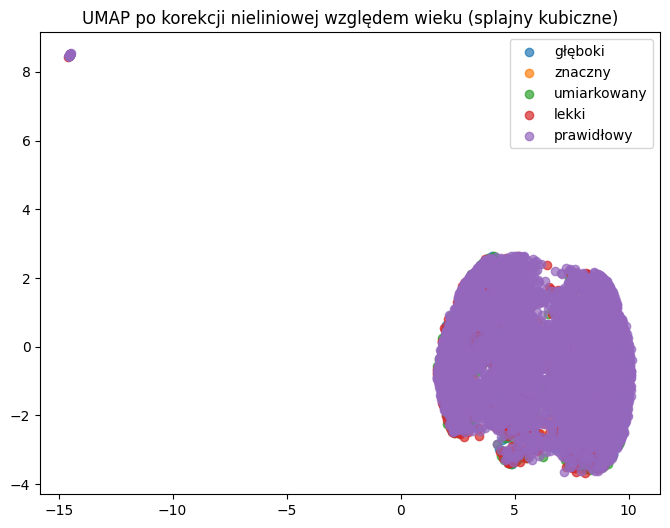

In [68]:
import pandas as pd
from sklearn.preprocessing import SplineTransformer
from sklearn.linear_model import LinearRegression
import umap.umap_ as umap
import matplotlib.pyplot as plt

df_all = pd.concat([
    df_gleboki.assign(group="głęboki"),
    df_znaczny.assign(group="znaczny"),
    df_umiarkowany.assign(group="umiarkowany"),
    df_lekki.assign(group="lekki"),
    df.assign(group="prawidłowy")
], axis=0)

features = df_all.drop(columns=["group", "identifier", "norm_confirmed", "age", "female", "sex", "Unnamed:0", "DATA_BADANIA", "DATA_BADANIA_MRI", "IF_FIRST",
                                 "L_BIAP", "P_BIAP","L_HEARING_TYPE", "P_HEARING_TYPE"], errors='ignore').columns
# --- Nieliniowe modelowanie wieku ---
spline = SplineTransformer(degree=3, n_knots=6)  # 6 węzłów = dość elastyczne
age_spline = spline.fit_transform(df_all[["age"]])

X_corrected = pd.DataFrame(index=df_all.index)

for col in features:
    lr = LinearRegression()
    lr.fit(age_spline, df_all[col])
    pred = lr.predict(age_spline)
    X_corrected[col] = df_all[col] - pred

# --- UMAP ----
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric="euclidean")
embedding = reducer.fit_transform(X_corrected)

plt.figure(figsize=(8,6))
for group in df_all["group"].unique():
    idx = df_all["group"] == group
    plt.scatter(embedding[idx, 0], embedding[idx, 1], label=group, alpha=0.7)

plt.legend()
plt.title("UMAP po korekcji nieliniowej względem wieku (splajny kubiczne)")
plt.show()


In [61]:
x = df_all.select_dtypes(exclude='number')


In [62]:
x

,sex,identifier,DATA_BADANIA_MRI,DATA_BADANIA,L_BIAP,P_BIAP,L_HEARING_TYPE,P_HEARING_TYPE,group
0,M,40502810321039,2011-02-14 00:00:00,2010-06-09 17:29:00,Gleboki,Gleboki,Niedosluch_odbiorczy_3,Niedosluch_odbiorczy_3,głęboki
13,M,35505609316306,2011-06-20 00:00:00,2011-04-19 11:19:00,Gleboki,Gleboki,Niedosluch_odbiorczy_3,Niedosluch_odbiorczy_3,głęboki
33,F,39504400224087,2011-03-07 00:00:00,2011-02-02 09:21:00,Gleboki,Gleboki,zaden typ nie pasuje,zaden typ nie pasuje,głęboki
57,F,31006401306150,2011-10-24 00:00:00,2011-05-26 13:36:00,Gleboki,Gleboki,Niedosluch_odbiorczy_3,Niedosluch_odbiorczy_3,głęboki
68,F,29503600824027,2011-01-27 00:00:00,2009-12-31 10:24:00,Gleboki,Gleboki,nie okreslono,nie okreslono,głęboki
...,...,...,...,...,...,...,...,...,...
10907,F,43002006614030,2024-02-21,17.01.2024 08:59,Prawidlowy,Prawidlowy,Sluch_prawidlowy,Sluch_prawidlowy,prawidłowy
10908,M,30503210607051,2024-07-30,25.01.2018 10:10,Prawidlowy,Prawidlowy,Sluch_prawidlowy,Sluch_prawidlowy,prawidłowy
10911,F,34002406826210,2024-08-26,17.10.2023 11:11,Prawidlowy,Prawidlowy,zaden typ nie pasuje,zaden typ nie pasuje,prawidłowy
10912,F,44006417718069,2024-06-17,12.11.2018 14:04,Prawidlowy,Prawidlowy,Sluch_prawidlowy,Sluch_prawidlowy,prawidłowy
